 
---



---



---
# **Human Activity Recognition by Smartphone & Smartwatch Kinematic Sensors**


---


---

---



Data set source:  WISDM Lab of Frodham University, NY

available from the UCI Machine Learning Repository

https://archive.ics.uci.edu/ml/datasets/WISDM+Smartphone+and+Smartwatch+Activity+and+Biometrics+Dataset+

For the source files of the dataset and additional background - see there.

**REMARK:**
I have detected the following apparent errors in these source files of the dataset:

The following feature columns are suspected to contain erronreous values:

'XSTANDDEV', 'YSTANDDEV', 'ZSTANDDEV', 'XVAR', 'YVAR', 'ZVAR'

The following files:

data_1611_accel_phone.arff - data_1617_accel_phone.arff

are all identical replicates on the file: data_1610_accel_phone.arff

---



### **Background summary on data collection method:**


---



Two kinds of devices:

1) Smartphone (Samsung Galaxy S5)

2) Smartwatch (LG G)

Two kinds of embedded kinematic sensors (for each device):

1) Accelerometer - for measurement of linear acceleration (m/sec^2)

**Remark:**

 It seems that the accelerometer doesn't, actually, measure the acceleration but rather the *force* exerted on it, calibrated per the mass of the device.
Hence, also while being in equilibrium state, (i.e. zero acceleration), the accelerometer outputs a vertical acceleration of 9.8 m/s^2, upwards.

2) Gyroscope - for measurement of angular velocity (rad/sec)



51 Participants

18 Physical Activities of daily living

*   Non hand oriented activities (leg):--->
{walking,
jogging, stairs, standing, kicking}
*   hand oriented activities:--->
{dribbling, playing catch, typing, writing, clapping,
brushing teeth, folding clothes}
*   Hand
oriented activities (eating):--->
{eating
pasta, eating soup, eating sandwich, eating
chips, drinking}

Each activity has been performed for the duration of 3 minutes

sensors sampling rate: 20 Hz (i.e. every 50 ms) - Only approximately - subject to OS constraints.

Number of raw measurements:  15,630,426

Device placement:

smartphone - placed in the participant's front right
pants leg pocket

smartwatch - wrapped on dominant hand

**Transformed, labeled, datasets:**


---


A sliding window approach is used to transform the time series data into a derived dataset of respective characterized, labeled data records, each of which describing a single time window data - window duration 10 sec (non overlapping)

Number of labled 10 sec window processed data records: 78,152 (51 x 3 x 60 x 20)

### Reference coordinate system definition:
---

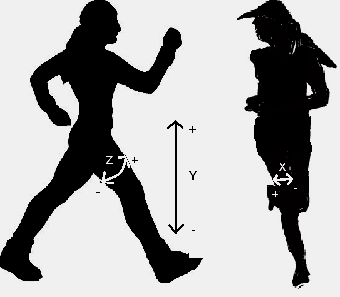

**Devices measurements reference axes (inferred from the raw data):**

---



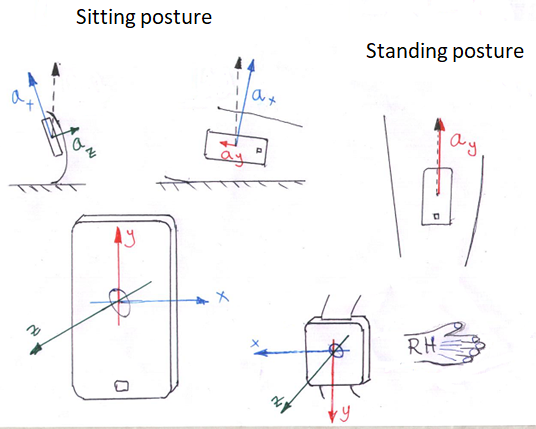

[](http://)/kaggle/input/smartphone-and-smartwatch-activity-and-biometrics/WISDM-dataset-description.pdf



---



---



---


<font size="4"> REMARK: This notebook is dedicated to analyzing mostly the Phone-Acceleration measurement Dataset (hence, it's suffix "PA")

It can be extended to analyze also the other measurement channels: Phone-Gyro, Watch-Acceleration, Watch-Gyro<font>


---



---



---



---
# **Exploratory Data Analysis of raw data (time series sensors data)**
---

In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [3]:
activity_codes_mapping = {'A': 'walking',
                          'B': 'jogging',
                          'C': 'stairs',
                          'D': 'sitting',
                          'E': 'standing',
                          'F': 'typing',
                          'G': 'brushing teeth',
                          'H': 'eating soup',
                          'I': 'eating chips',
                          'J': 'eating pasta',
                          'K': 'drinking from cup',
                          'L': 'eating sandwich',
                          'M': 'kicking soccer ball',
                          'O': 'playing catch tennis ball',
                          'P': 'dribbling basket ball',
                          'Q': 'writing',
                          'R': 'clapping',
                          'S': 'folding clothes'}

activity_color_map = {activity_codes_mapping['A']: 'lime',
                      activity_codes_mapping['B']: 'red',
                      activity_codes_mapping['C']: 'blue',
                      activity_codes_mapping['D']: 'orange',
                      activity_codes_mapping['E']: 'yellow',
                      activity_codes_mapping['F']: 'lightgreen',
                      activity_codes_mapping['G']: 'greenyellow',
                      activity_codes_mapping['H']: 'magenta',
                      activity_codes_mapping['I']: 'gold',
                      activity_codes_mapping['J']: 'cyan',
                      activity_codes_mapping['K']: 'purple',
                      activity_codes_mapping['L']: 'lightgreen',
                      activity_codes_mapping['M']: 'violet',
                      activity_codes_mapping['O']: 'limegreen',
                      activity_codes_mapping['P']: 'deepskyblue',   
                      activity_codes_mapping['Q']: 'mediumspringgreen',
                      activity_codes_mapping['R']: 'plum',
                      activity_codes_mapping['S']: 'olive'}
#                     activity_codes_mapping['A']: 'rgb(231, 41, 138)',
                          



---


# **Exploration of raw data files:**


---



In [4]:
def show_accel_per_activity(device, df, act, interval_in_sec = None):
  ''' Plots acceleration time history per activity '''

  df1 = df.loc[df.activity == act].copy()
  df1.reset_index(drop = True, inplace = True)

  df1['duration'] = (df1['timestamp'] - df1['timestamp'].iloc[0])/1000000000 # nanoseconds --> seconds

  if interval_in_sec == None:
    ax = df1[:].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)
  else:
    ax = df1[:interval_in_sec*20].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)

  ax.set_xlabel('duration  (sec)', fontsize = 15)
  ax.set_ylabel('acceleration  (m/sec^2)',fontsize = 15)
  ax.set_title('Acceleration:   Device: ' + device + '      Activity:  ' + act, fontsize = 15)



In [5]:
def show_ang_velocity_per_activity(device, df, act, interval_in_sec = None):
  ''' Plots angular volocity time history per activity '''

  df1 = df.loc[df.activity == act].copy()
  df1.reset_index(drop = True, inplace = True)

  df1['duration'] = (df1['timestamp'] - df1['timestamp'].iloc[0])/1000000000 # nanoseconds --> seconds

  if interval_in_sec == None:
    ax = df1[:].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)
  else:
    ax = df1[:interval_in_sec*20].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)

  ax.set_xlabel('duration  (sec)', fontsize = 15)
  ax.set_ylabel('angular velocity  (rad/sec)',fontsize = 15)
  ax.set_title('Angular velocity:  Device: ' + device + '      Activity:  ' + act, fontsize = 15)





---


## **Visualization of the time-series raw data for individual participants:**


---



## **1) Phone - Acceleration** measurement data:

**EDA Typical example: Participant no. 10 - Smartphone - Accelerometer reading history**

In [5]:
raw_par_10_phone_accel = pd.read_csv(r'/kaggle/input/wisdm-dataset/wisdm-dataset/raw/phone/accel/data_1610_accel_phone.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_10_phone_accel.z = raw_par_10_phone_accel.z.str.strip(';')
raw_par_10_phone_accel.z = pd.to_numeric(raw_par_10_phone_accel.z)

raw_par_10_phone_accel['activity'] = raw_par_10_phone_accel['activity_code'].map(activity_codes_mapping)

raw_par_10_phone_accel = raw_par_10_phone_accel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_10_phone_accel


,participant_id,activity_code,activity,timestamp,x,y,z
0,1610,A,walking,18687441561967,1.174957,13.347473,-4.034637
1,1610,A,walking,18687491915971,1.408188,7.091858,-3.895721
2,1610,A,walking,18687542269974,4.932510,6.306808,-2.339004
3,1610,A,walking,18687592623978,0.154648,6.123505,-1.831467
4,1610,A,walking,18687642977982,-2.826035,4.180542,-3.211899
...,...,...,...,...,...,...,...
80865,1610,S,folding clothes,17989031516129,5.946732,7.583008,-1.097259
80866,1610,S,folding clothes,17989081870133,5.818741,7.804871,-1.623733
80867,1610,S,folding clothes,17989132224137,5.530823,7.636093,-1.662643
80868,1610,S,folding clothes,17989182578141,5.802170,7.645752,-1.000412


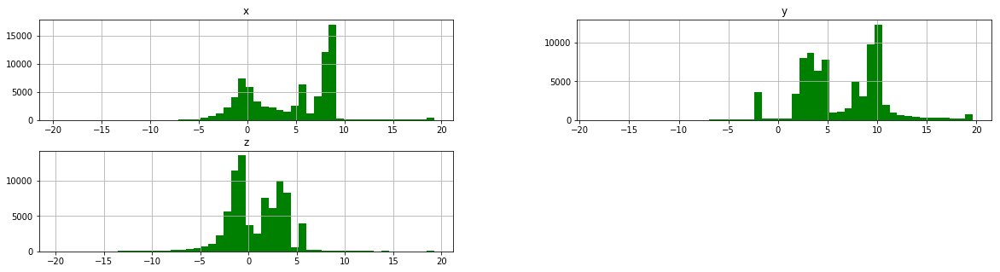

In [6]:
#T = raw_par_10_phone_accel.iloc[:200]
T = raw_par_10_phone_accel
_ = T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')
#T.hist(column='x', by='activity')

**Observation: largely bimodal nature; probably corresponds to standing - sitting related typical posture separation !**

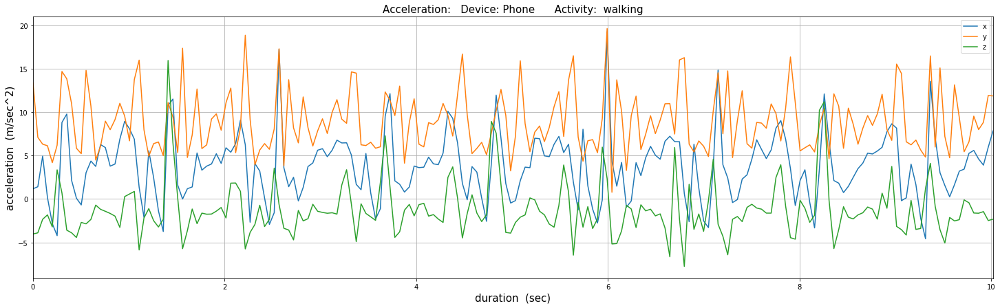

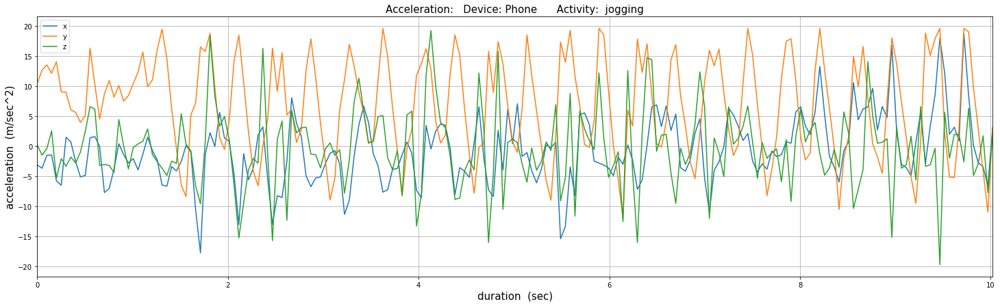

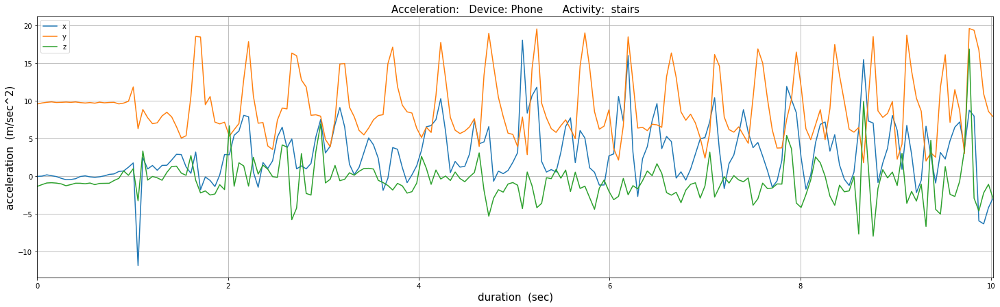

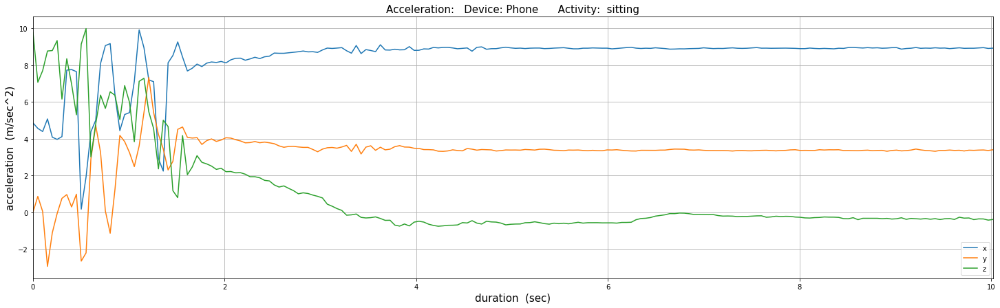

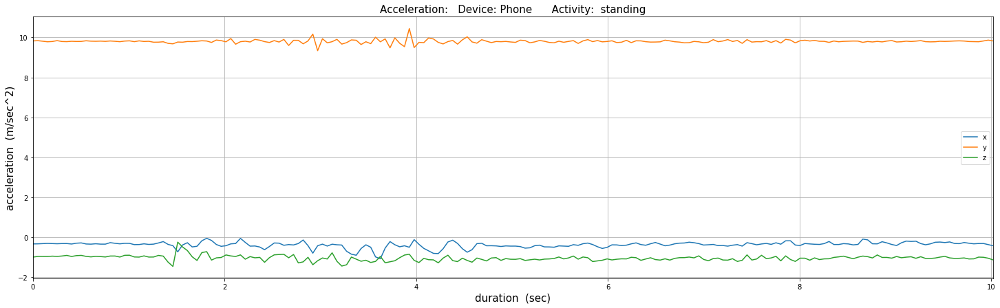

...

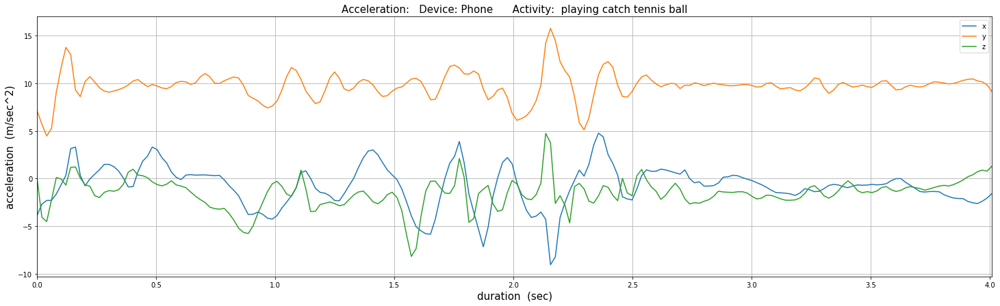

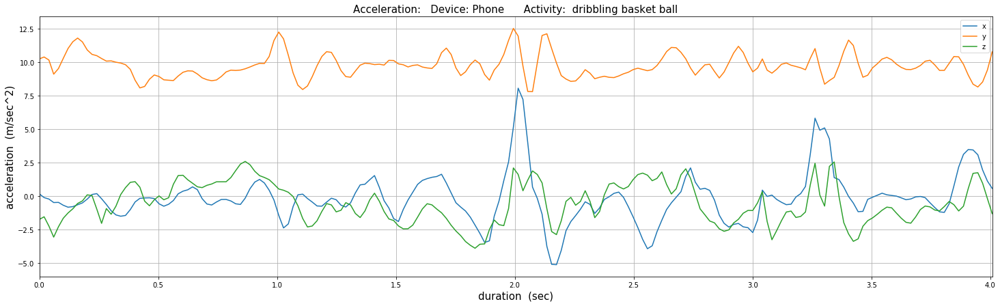

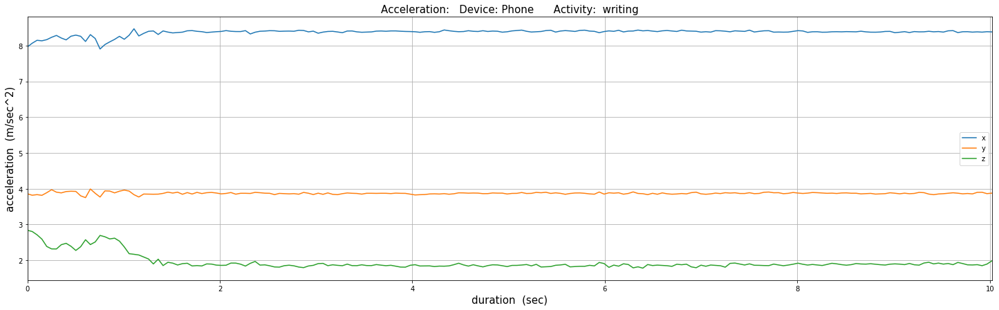

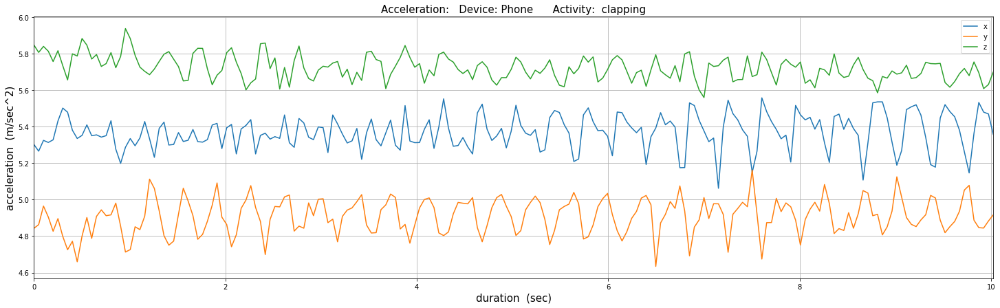

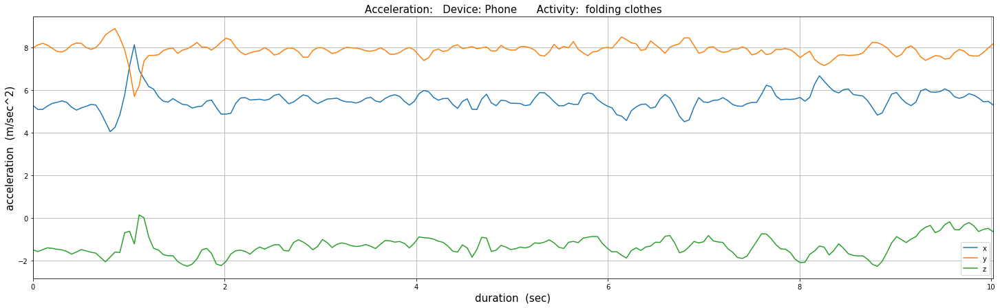

In [7]:
for key in activity_codes_mapping:
  show_accel_per_activity('Phone', raw_par_10_phone_accel, activity_codes_mapping[key], 10)


## **2) watch - acceleration** measurement data:

**EDA Typical example: Participant no. 20 - Smartwatch - Accelerometer reading history**

In [8]:
raw_par_20_watch_accel = pd.read_csv(r'/kaggle/input/wisdm-dataset/wisdm-dataset/raw/watch/accel/data_1620_accel_watch.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_20_watch_accel.z = raw_par_20_watch_accel.z.str.strip(';')
raw_par_20_watch_accel.z = pd.to_numeric(raw_par_20_watch_accel.z)

raw_par_20_watch_accel['activity'] = raw_par_20_watch_accel['activity_code'].map(activity_codes_mapping)

raw_par_20_watch_accel = raw_par_20_watch_accel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_20_watch_accel


,participant_id,activity_code,activity,timestamp,x,y,z
0,1620,A,walking,37945621841814,3.417424,-2.164957,-4.849306
1,1620,A,walking,37945671341814,5.423765,-6.936601,-4.954651
2,1620,A,walking,37945720841814,4.700716,-3.127426,-7.648128
3,1620,A,walking,37945770341814,8.033444,-4.700417,-5.024083
4,1620,A,walking,37945819841814,3.970484,-1.645415,-3.621080
...,...,...,...,...,...,...,...
67189,1620,S,folding clothes,42368439960621,6.524798,-4.589834,0.573262
67190,1620,S,folding clothes,42368489889911,9.100959,-4.168455,-0.602291
67191,1620,S,folding clothes,42368539819201,7.590218,-5.736657,-1.854459
67192,1620,S,folding clothes,42368589748491,8.681973,-6.284929,-5.180005


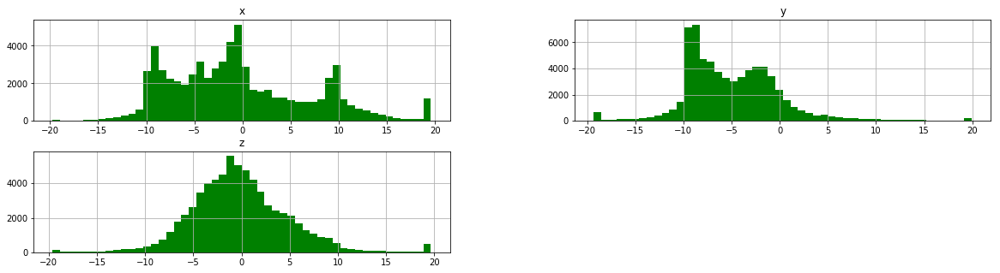

In [9]:
#T = raw_par_20_watch_accel.iloc[:200]
T = raw_par_20_watch_accel
_ = T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')

**Observation: modes separations: hand downwards --- hand upwards --- hand horizontal ( two roll positions)**

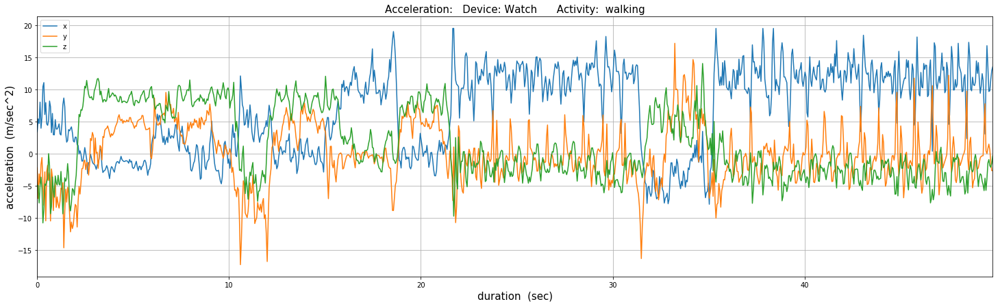

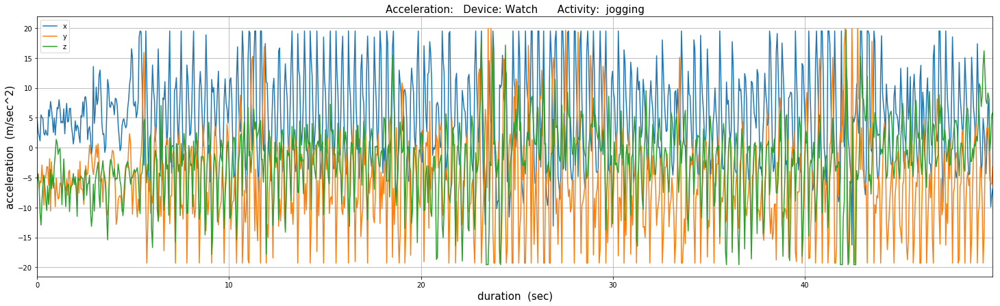

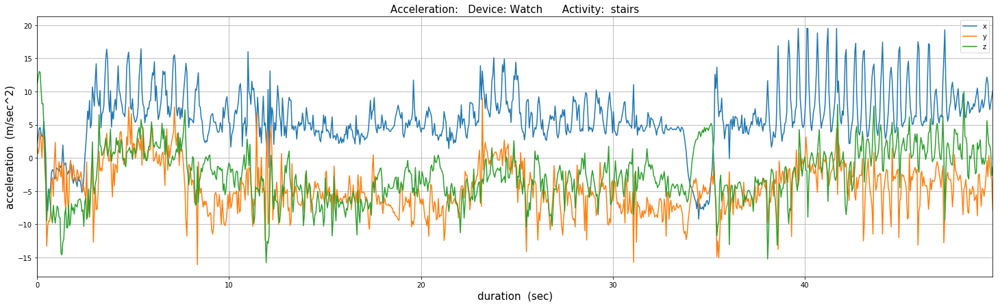

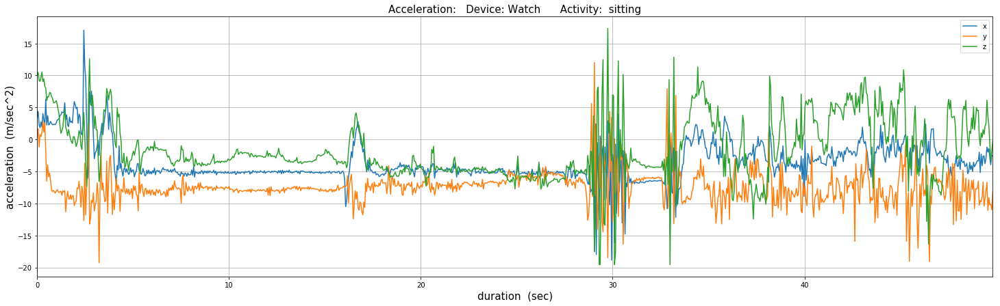

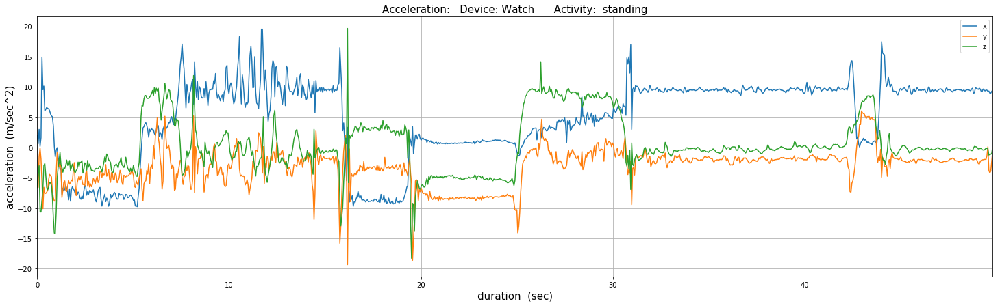

...

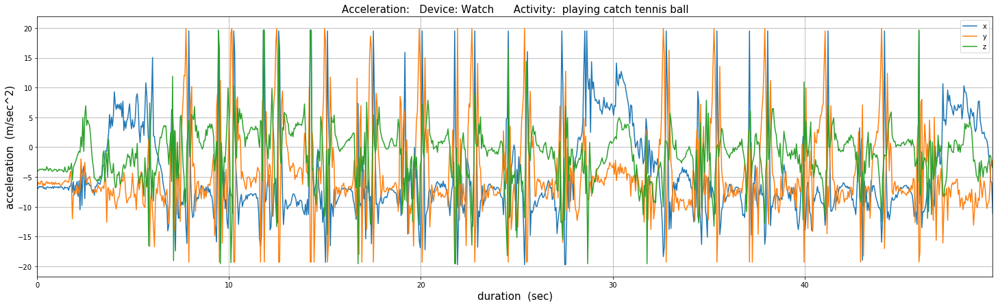

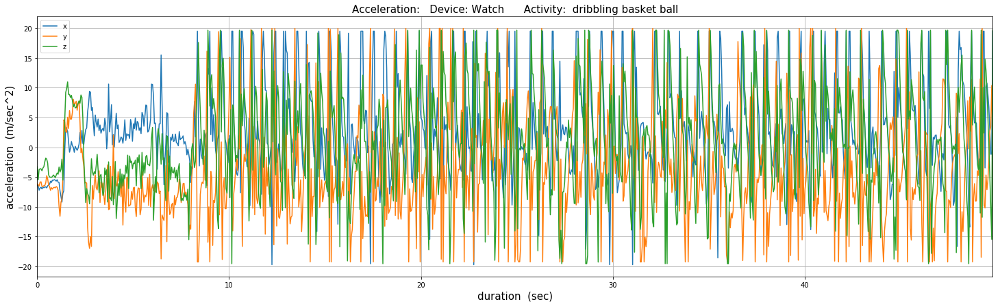

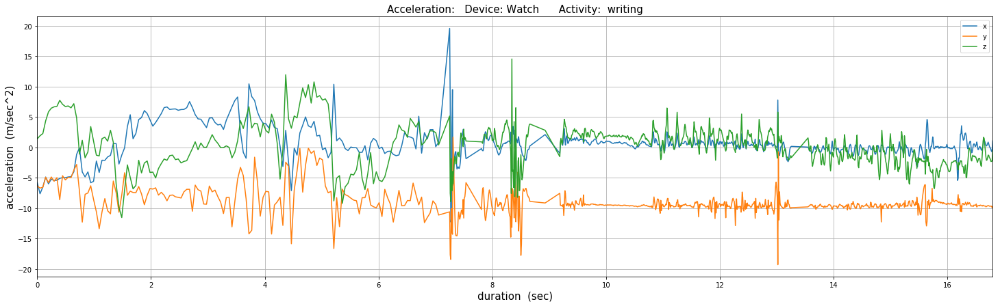

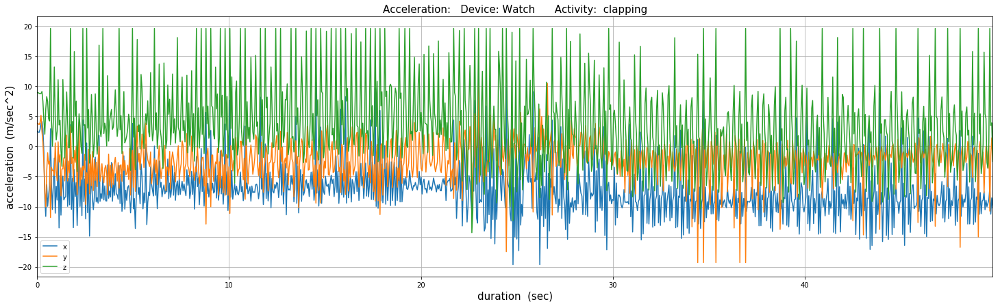

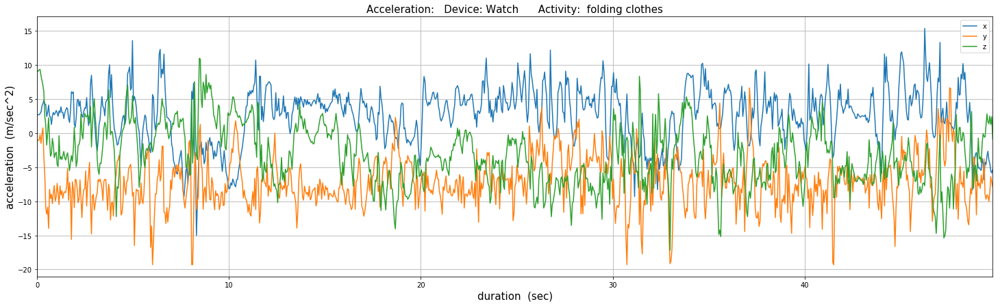

In [10]:
for key in activity_codes_mapping:
  show_accel_per_activity('Watch', raw_par_20_watch_accel, activity_codes_mapping[key], 50)

## **3) phone - angular velocity** measurment data:

**EDA typical example: Participant no. 35 - Smartphone - angular velocity reading history**

In [11]:
raw_par_35_phone_ang_vel = pd.read_csv(r'/kaggle/input/wisdm-dataset/wisdm-dataset/raw/phone/gyro/data_1635_gyro_phone.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_35_phone_ang_vel.z = raw_par_35_phone_ang_vel.z.str.strip(';')
raw_par_35_phone_ang_vel.z = pd.to_numeric(raw_par_35_phone_ang_vel.z)

raw_par_35_phone_ang_vel['activity'] = raw_par_35_phone_ang_vel['activity_code'].map(activity_codes_mapping)

raw_par_35_phone_ang_vel = raw_par_35_phone_ang_vel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_35_phone_ang_vel

,participant_id,activity_code,activity,timestamp,x,y,z
0,1635,A,walking,676165107876419,0.874725,-0.098099,0.807510
1,1635,A,walking,676165158230423,0.563431,-1.359665,1.432419
2,1635,A,walking,676165208584427,1.507690,-3.086883,0.679016
3,1635,A,walking,676165258938431,1.430603,-1.860306,0.451035
4,1635,A,walking,676165309292435,0.325165,-1.735611,0.252365
...,...,...,...,...,...,...,...
64530,1635,S,folding clothes,680277872380268,-0.119614,-0.032928,0.129654
64531,1635,S,folding clothes,680277922750286,-0.500427,-0.465652,0.098923
64532,1635,S,folding clothes,680277973104290,-0.768646,-0.448929,0.063583
64533,1635,S,folding clothes,680278023458294,-0.786408,-0.346924,0.099899


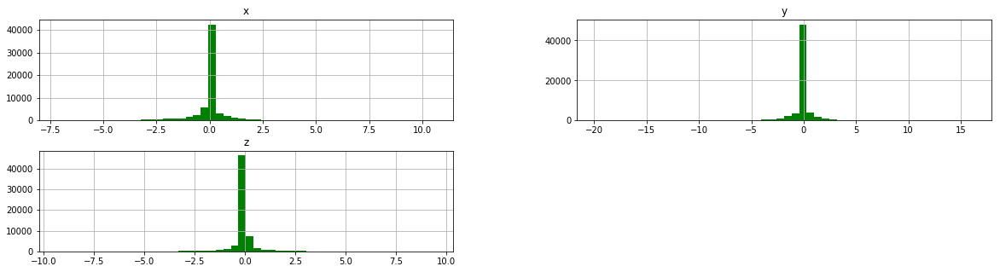

In [12]:
T = raw_par_35_phone_ang_vel
_ = T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')

**Observation: zero centered, low level, symmetrical in all axes**

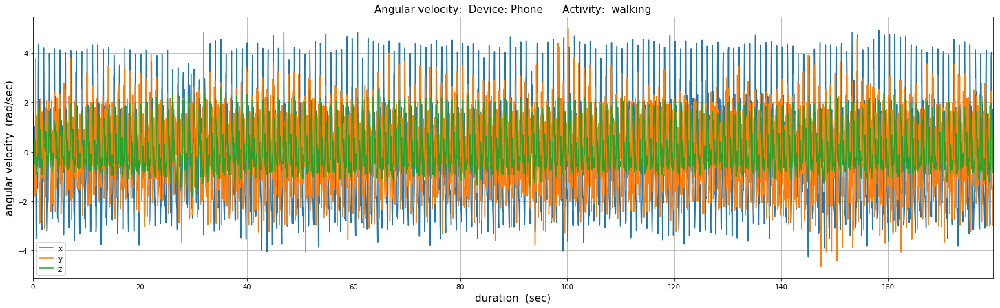

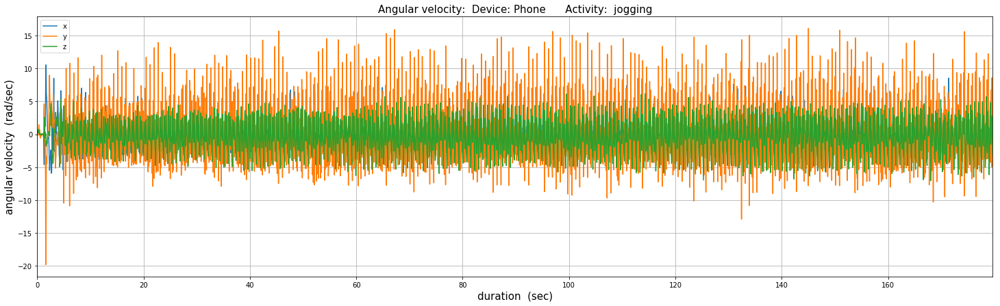

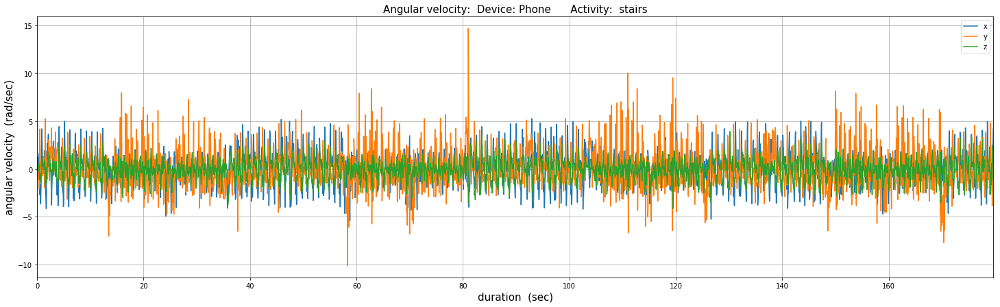

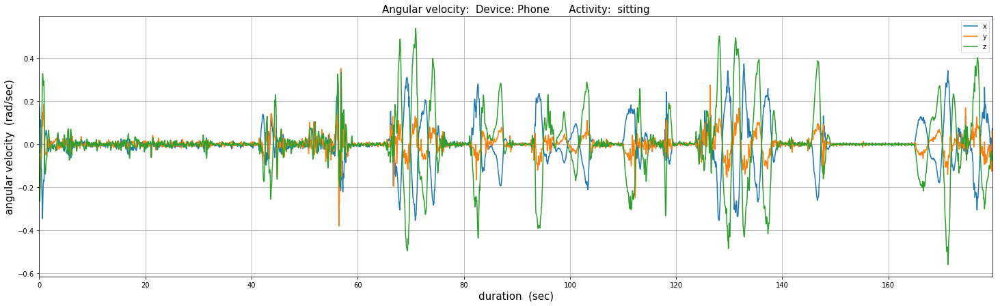

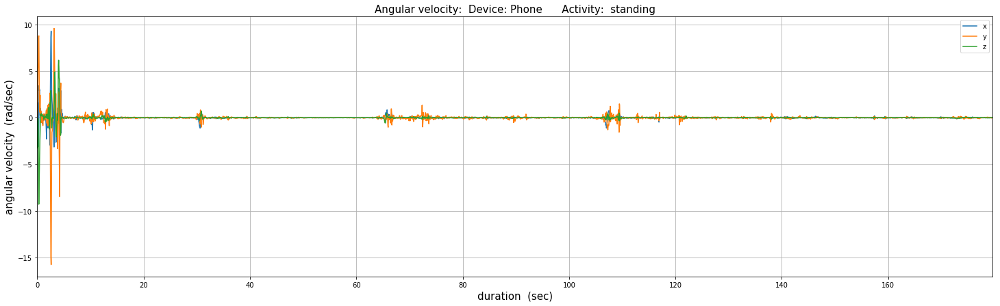

...

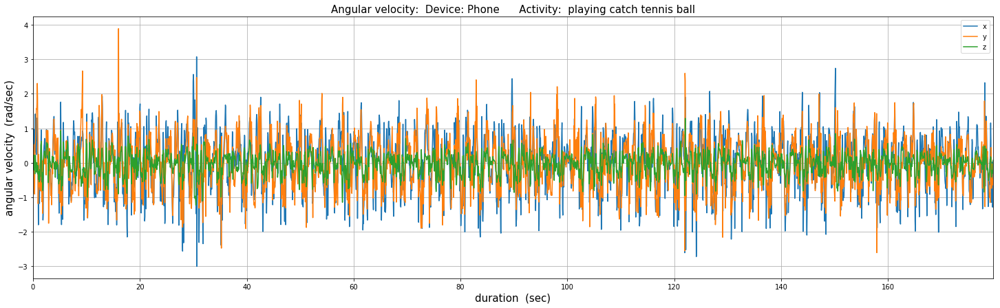

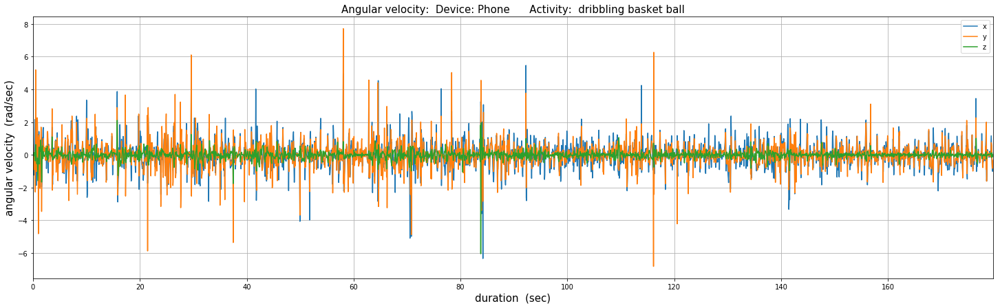

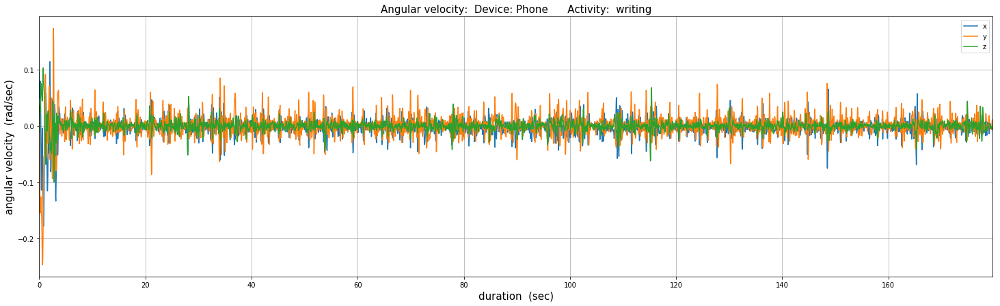

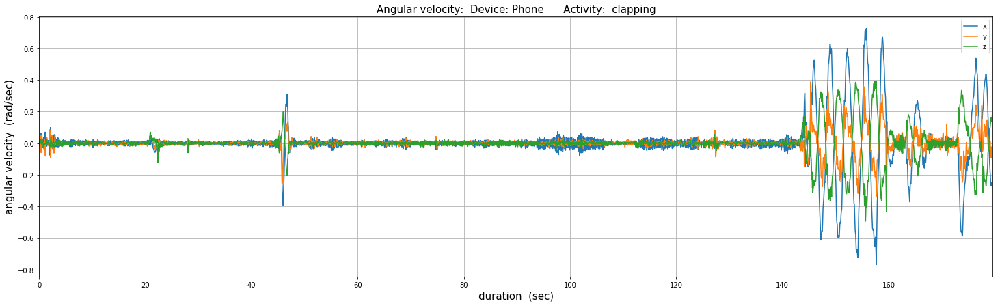

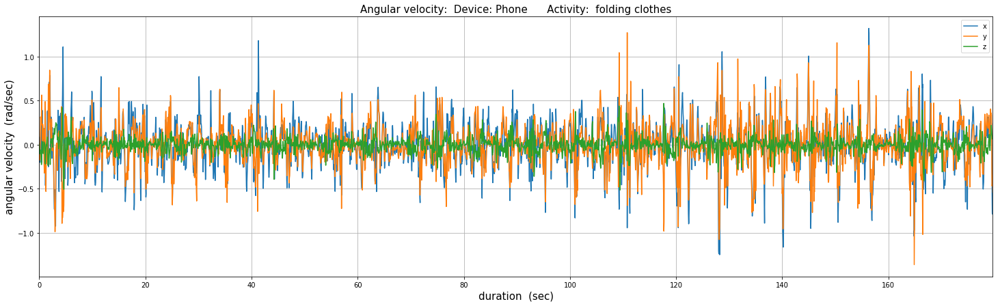

In [13]:
for key in activity_codes_mapping:
  show_ang_velocity_per_activity('Phone', raw_par_35_phone_ang_vel, activity_codes_mapping[key])

## **4) watch - angular velocity** measurement data:


**EDA typical example:  Participant no. 45 - Watch - angular velocity history**

In [14]:
raw_par_45_watch_ang_vel = pd.read_csv(r'/kaggle/input/wisdm-dataset/wisdm-dataset/raw/watch/gyro/data_1635_gyro_watch.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_45_watch_ang_vel.z = raw_par_45_watch_ang_vel.z.str.strip(';')
raw_par_45_watch_ang_vel.z = pd.to_numeric(raw_par_45_watch_ang_vel.z)

raw_par_45_watch_ang_vel['activity'] = raw_par_45_watch_ang_vel['activity_code'].map(activity_codes_mapping)

raw_par_45_watch_ang_vel = raw_par_45_watch_ang_vel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_45_watch_ang_vel

,participant_id,activity_code,activity,timestamp,x,y,z
0,1635,A,walking,64768437041043,0.117911,-0.145542,-1.300821
1,1635,A,walking,64768486541043,1.038300,-0.455534,-1.134640
2,1635,A,walking,64768536041043,0.876380,-0.541820,-0.844888
3,1635,A,walking,64768585541043,0.912599,-0.388422,-0.394281
4,1635,A,walking,64768635041043,0.048669,-0.046472,0.288553
...,...,...,...,...,...,...,...
64853,1635,S,folding clothes,68881084984774,-0.426159,0.298781,2.808190
64854,1635,S,folding clothes,68881134912344,1.008752,-0.439448,2.320299
64855,1635,S,folding clothes,68881184839914,0.938445,-0.437317,1.726947
64856,1635,S,folding clothes,68881234767484,1.552037,-0.296702,1.282732


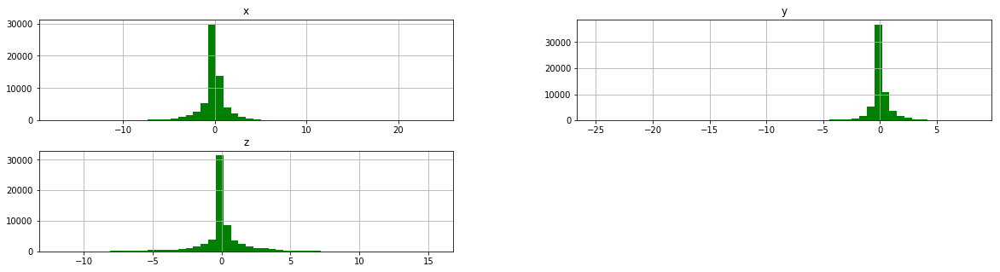

In [15]:
T = raw_par_45_watch_ang_vel
_ = T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')

**Observation: zero centered, low level, symmetrical in all exes -- however, angular velocities of hand movements (watch) are typically, greater that these of body (phone)**

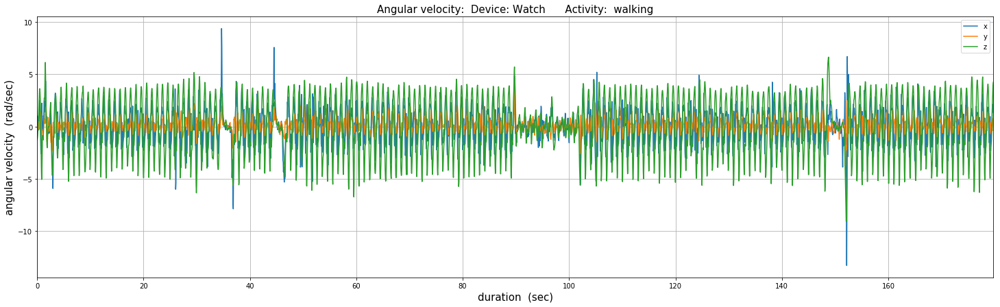

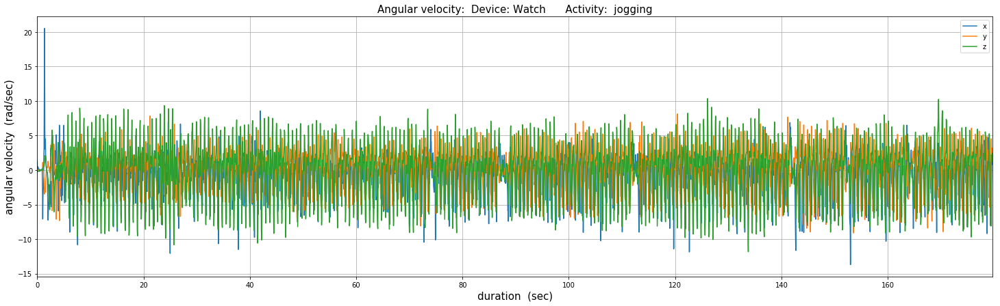

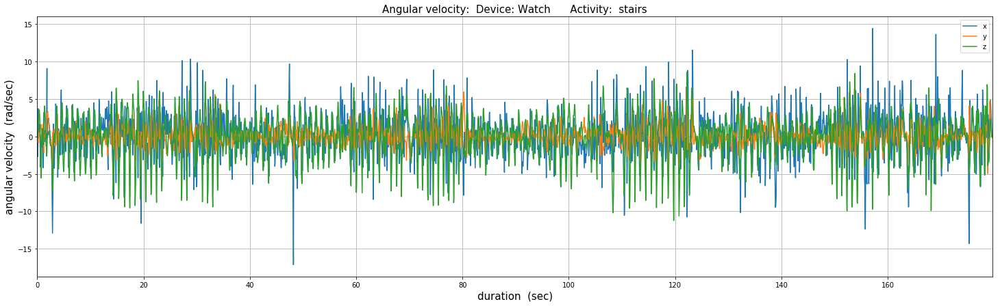

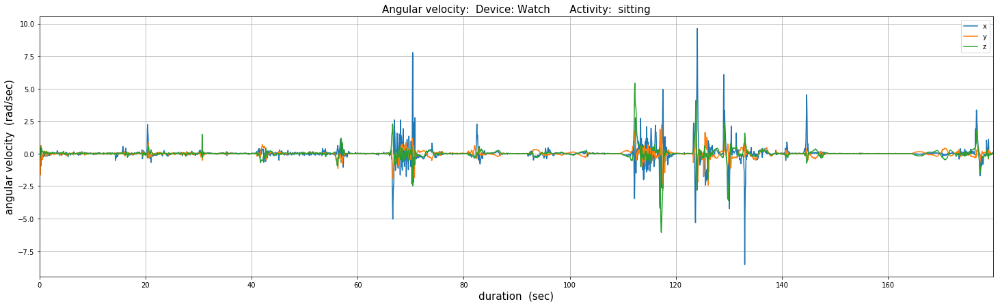

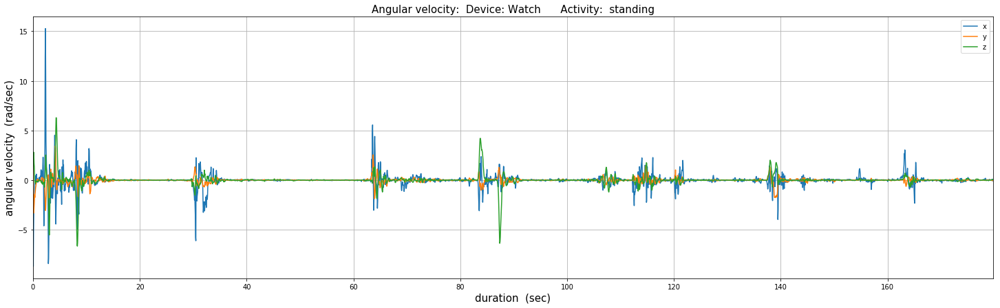

...

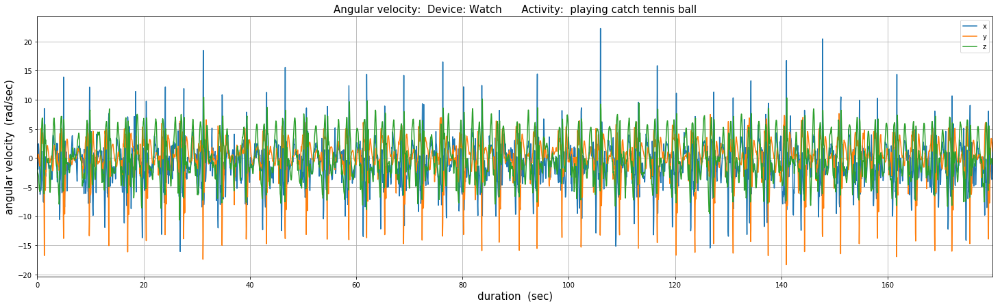

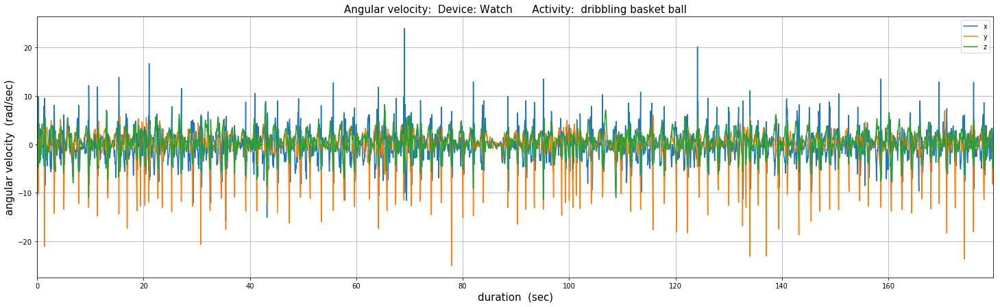

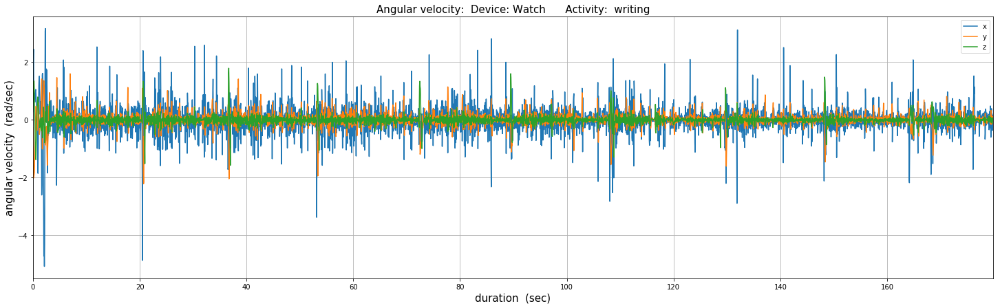

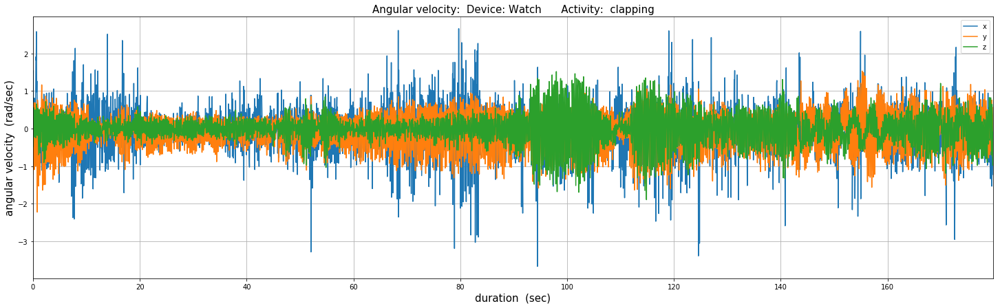

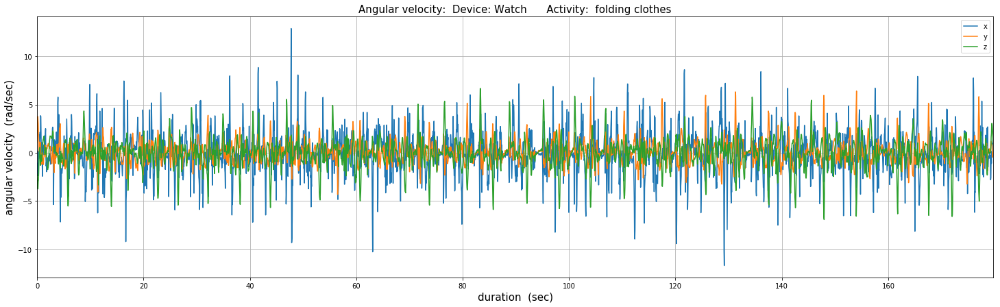

In [16]:
for key in activity_codes_mapping:
  show_ang_velocity_per_activity('Watch', raw_par_45_watch_ang_vel, activity_codes_mapping[key])



---



---



---


---
# **Construction of the Transformed, labeled dataset for the application of Machine Learning models:**
---


---



---



---



## **Features definition and Construction:**

In [17]:
features = ['ACTIVITY',
            'X0', # 1st bin fraction of x axis acceleration distribution
            'X1', # 2nd bin fraction ...
            'X2',
            'X3',
            'X4',
            'X5',
            'X6',
            'X7',
            'X8',
            'X9',
            'Y0', # 1st bin fraction of y axis acceleration distribution
            'Y1', # 2nd bin fraction ...
            'Y2',
            'Y3',
            'Y4',
            'Y5',
            'Y6',
            'Y7',
            'Y8',
            'Y9',
            'Z0', # 1st bin fraction of z axis acceleration distribution
            'Z1', # 2nd bin fraction ...
            'Z2',
            'Z3',
            'Z4',
            'Z5',
            'Z6',
            'Z7',
            'Z8',
            'Z9',
            'XAVG', # average sensor value over the window (per axis)
            'YAVG',
            'ZAVG',
            'XPEAK', # Time in milliseconds between the peaks in the wave associated with most activities. heuristically determined (per axis)
            'YPEAK',
            'ZPEAK',
            'XABSOLDEV', # Average absolute difference between the each of the 200 readings and the mean of those values (per axis)
            'YABSOLDEV',
            'ZABSOLDEV',
            'XSTANDDEV', # Standard deviation of the 200 window's values (per axis)  ***BUG!***
            'YSTANDDEV',
            'ZSTANDDEV',
            'XVAR', # Variance of the 200 window's values (per axis)   ***BUG!***
            'YVAR',
            'ZVAR',
            'XMFCC0', # short-term power spectrum of a wave, based on a linear cosine transform of a log power spectrum on a non-linear mel scale of frequency (13 values per axis)
            'XMFCC1',
            'XMFCC2',
            'XMFCC3',
            'XMFCC4',
            'XMFCC5',
            'XMFCC6',
            'XMFCC7',
            'XMFCC8',
            'XMFCC9',
            'XMFCC10',
            'XMFCC11',
            'XMFCC12',
            'YMFCC0', # short-term power spectrum of a wave, based on a linear cosine transform of a log power spectrum on a non-linear mel scale of frequency (13 values per axis)
            'YMFCC1',
            'YMFCC2',
            'YMFCC3',
            'YMFCC4',
            'YMFCC5',
            'YMFCC6',
            'YMFCC7',
            'YMFCC8',
            'YMFCC9',
            'YMFCC10',
            'YMFCC11',
            'YMFCC12',
            'ZMFCC0', # short-term power spectrum of a wave, based on a linear cosine transform of a log power spectrum on a non-linear mel scale of frequency (13 values per axis)
            'ZMFCC1',
            'ZMFCC2',
            'ZMFCC3',
            'ZMFCC4',
            'ZMFCC5',
            'ZMFCC6',
            'ZMFCC7',
            'ZMFCC8',
            'ZMFCC9',
            'ZMFCC10',
            'ZMFCC11',
            'ZMFCC12',
            'XYCOS', # The cosine distances between sensor values for pairs of axes (three pairs of axes)
            'XZCOS',
            'YZCOS',
            'XYCOR', # The correlation between sensor values for pairs of axes (three pairs of axes)
            'XZCOR',
            'YZCOR',
            'RESULTANT', # Average resultant value, computed by squaring each matching x, y, and z value, summing them, taking the square root, and then averaging these values over the 200 readings
            'PARTICIPANT'] # Categirical: 1600 -1650

len(features)

93

In [18]:
import glob

#the duplicate files to be ignored; all identical to 1600
duplicate_files = [str(i) for i in range(1611, 1618)] # '1611',...'1617'

path = r'/kaggle/input/wisdm-dataset/wisdm-dataset/arff_files/phone/accel'
all_files = glob.glob(path + "/*.arff")

list_dfs_phone_accel = []

for filename in all_files:

    if any(dup_fn in filename for dup_fn in duplicate_files):
        continue #ignore the duplicate files
    df = pd.read_csv(filename, names = features, skiprows = 96, index_col=None, header=0)
    list_dfs_phone_accel.append(df)

all_phone_accel = pd.concat(list_dfs_phone_accel, axis=0, ignore_index=True, sort=False)

all_phone_accel

,ACTIVITY,X0,X1,X2,X3,X4,X5,X6,X7,X8,...,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT,PARTICIPANT
0,A,1.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0.0,...,0.507059,0.500543,0.759415,0.112659,0.361905,-0.066618,-0.466076,0.253649,10.46780,1606
1,A,1.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0.0,...,0.453408,0.447582,0.857557,-0.146796,0.093155,0.216493,-0.220621,0.335279,10.29390,1606
2,A,0.995,0.005,0.0,0.0,0.000,0.000,0.000,0.0,0.0,...,0.436167,0.430562,0.880145,-0.044116,0.171598,0.214562,-0.288840,0.304985,10.22760,1606
3,A,1.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0.0,...,0.394547,0.389477,0.901165,-0.037205,0.167753,0.284814,-0.234228,0.341018,10.16460,1606
4,A,1.000,0.000,0.0,0.0,0.000,0.000,0.000,0.0,0.0,...,0.427727,0.422230,0.891734,-0.036778,0.182924,0.288558,-0.214978,0.360318,10.22580,1606
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20645,S,0.000,0.000,0.0,0.0,0.235,0.760,0.005,0.0,0.0,...,0.332231,0.327962,0.957725,0.757090,0.809473,-0.039945,-0.880840,0.113856,9.33236,1630
20646,S,0.000,0.000,0.0,0.0,0.005,0.975,0.020,0.0,0.0,...,0.275603,0.272061,0.939358,0.810585,0.830185,-0.284476,-0.579337,0.250499,9.41948,1630
20647,S,0.000,0.000,0.0,0.0,0.115,0.870,0.015,0.0,0.0,...,0.270850,0.267370,0.945099,0.589973,0.730004,-0.361196,-0.918245,0.416269,9.38400,1630
20648,S,0.000,0.000,0.0,0.0,0.000,0.970,0.030,0.0,0.0,...,0.268576,0.265125,0.963445,0.694943,0.674903,0.169844,-0.528478,-0.084549,9.45693,1630


In [19]:
all_phone_accel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20650 entries, 0 to 20649
Data columns (total 93 columns):
ACTIVITY       20650 non-null object
X0             20650 non-null float64
X1             20650 non-null float64
X2             20650 non-null float64
X3             20650 non-null float64
X4             20650 non-null float64
X5             20650 non-null float64
X6             20650 non-null float64
X7             20650 non-null float64
X8             20650 non-null float64
X9             20650 non-null float64
Y0             20650 non-null float64
Y1             20650 non-null float64
Y2             20650 non-null float64
Y3             20650 non-null float64
Y4             20650 non-null float64
Y5             20650 non-null float64
Y6             20650 non-null float64
Y7             20650 non-null float64
Y8             20650 non-null float64
Y9             20650 non-null float64
Z0             20650 non-null float64
Z1             20650 non-null float64
Z2             206

In [20]:
all_phone_accel_breakpoint = all_phone_accel.copy()

In [21]:
all_phone_accel['ACTIVITY'].map(activity_codes_mapping).value_counts()

drinking from cup            1202
kicking soccer ball          1196
jogging                      1194
standing                     1175
brushing teeth               1174
walking                      1169
clapping                     1162
playing catch tennis ball    1161
sitting                      1155
folding clothes              1153
dribbling basket ball        1149
eating soup                  1144
eating sandwich              1134
writing                      1133
eating chips                 1128
eating pasta                 1077
stairs                       1072
typing                       1072
Name: ACTIVITY, dtype: int64

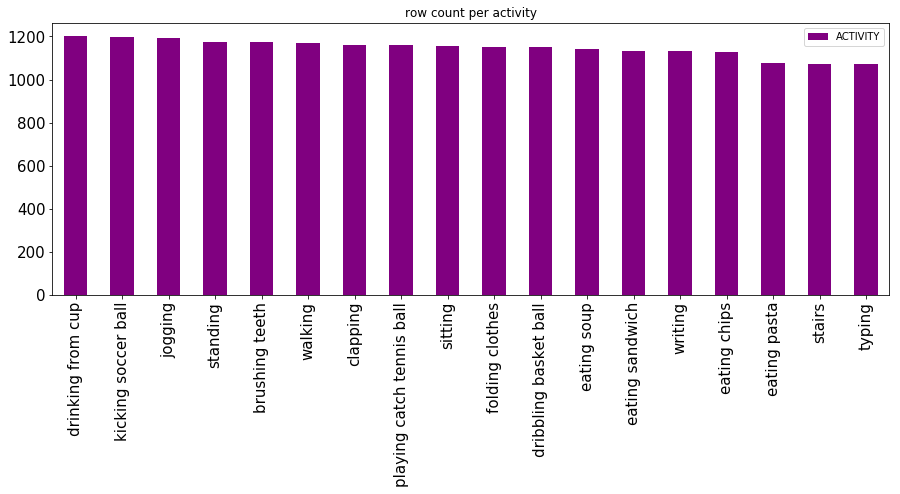

In [22]:
_ = all_phone_accel['ACTIVITY'].map(activity_codes_mapping).value_counts().plot(kind = 'bar', figsize = (15,5), color = 'purple', title = 'row count per activity', legend = True, fontsize = 15)

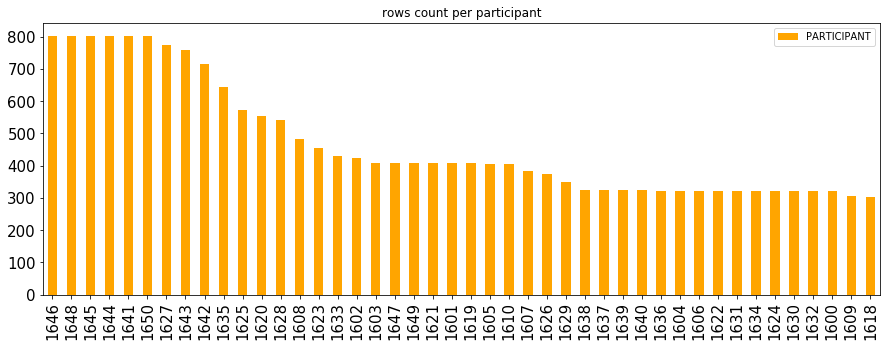

In [23]:
_ = all_phone_accel['PARTICIPANT'].value_counts().plot(kind = 'bar', figsize = (15,5), color = 'orange', title= 'rows count per participant', legend = True, fontsize = 15)

**The following columns:'XSTANDDEV',	'YSTANDDEV',	'ZSTANDDEV'	,'XVAR',	'YVAR',	'ZVAR' are suspected to contain erroneous data: ( e.g. absolute deviation is not of the same order of magnitude of standard deviation; variance is not the square of standard deviation !!!)**

In [24]:
all_phone_accel[['XABSOLDEV', 'YABSOLDEV','ZABSOLDEV','XSTANDDEV', 'YSTANDDEV', 'ZSTANDDEV', 'XVAR', 'YVAR', 'ZVAR']].head()

,XABSOLDEV,YABSOLDEV,ZABSOLDEV,XSTANDDEV,YSTANDDEV,ZSTANDDEV,XVAR,YVAR,ZVAR
0,2.40988,1.80406,1.71420,0.222963,0.165124,0.163652,0.472189,0.406354,0.404540
1,2.23837,1.45704,1.67958,0.193578,0.128893,0.151462,0.439975,0.359017,0.389181
2,2.03384,1.34099,1.54358,0.183350,0.118636,0.135922,0.428194,0.344435,0.368675
3,1.77278,1.24453,1.39205,0.162221,0.111081,0.125015,0.402766,0.333288,0.353575
4,1.98744,1.38633,1.44612,0.175799,0.120134,0.127265,0.419284,0.346603,0.356742


**Therefore they will be dropped from the dataset**

In [25]:
all_phone_accel.drop(['XSTANDDEV','YSTANDDEV','ZSTANDDEV','XVAR','YVAR','ZVAR'], axis = 1, inplace = True)

**Reviewing the histograms of the dataset features**

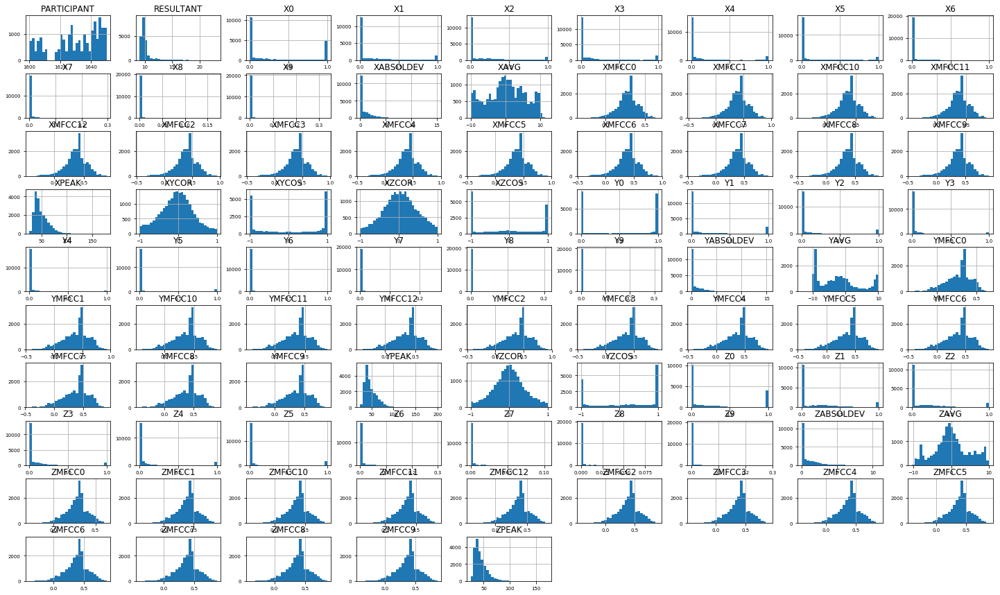

In [26]:
ax = all_phone_accel.hist(bins=30, figsize=(25, 15), xlabelsize = 7, ylabelsize = 7)

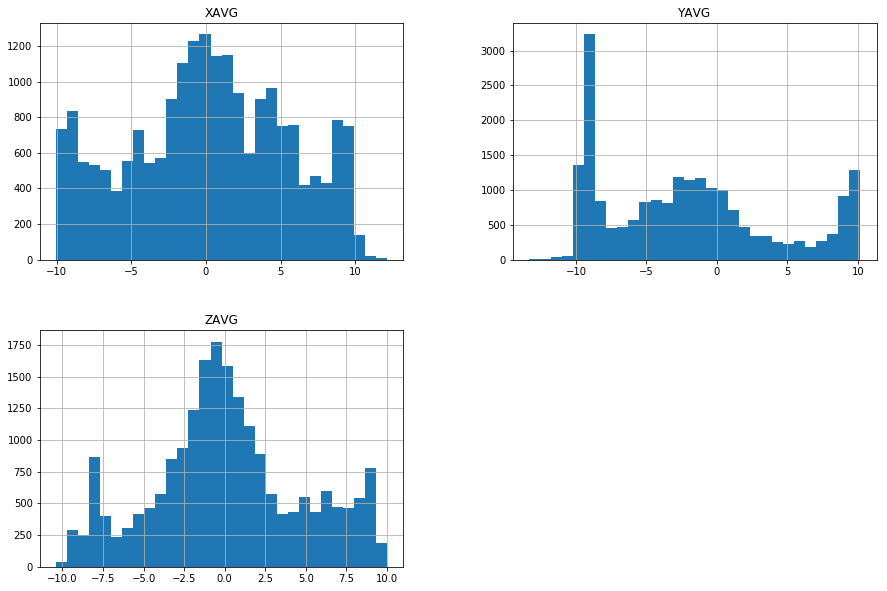

In [27]:
_ = all_phone_accel[['XAVG', 'YAVG', 'ZAVG']].hist(bins=30, figsize=(15, 10))

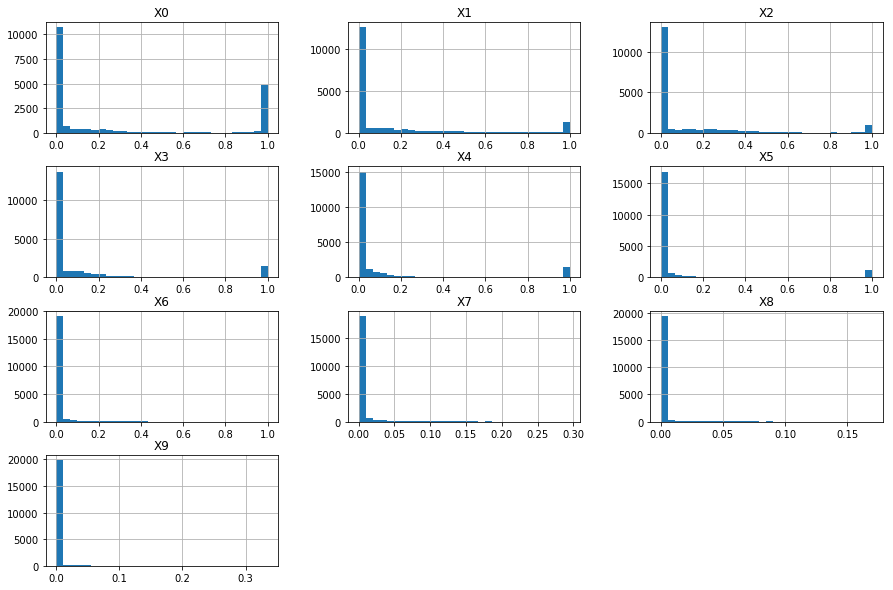

In [28]:
_ = all_phone_accel[['X0', 'X1', 'X2', 'X3','X4','X5','X6','X7','X8','X9']].hist(bins=30, figsize=(15, 10))

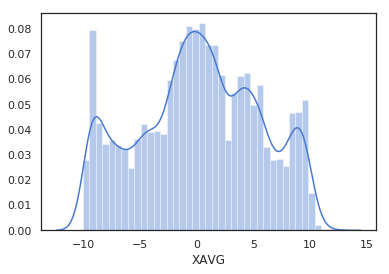

In [29]:
import seaborn as sns

sns.set(color_codes=True)
sns.set(style="white", palette="muted")
_ = sns.distplot(all_phone_accel['XAVG'])

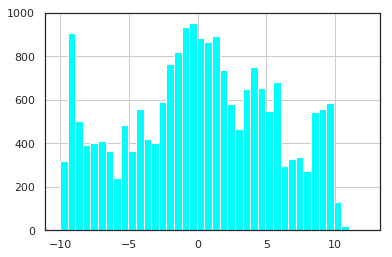

In [30]:
_ = all_phone_accel['XAVG'].hist(bins=40, color = 'cyan')

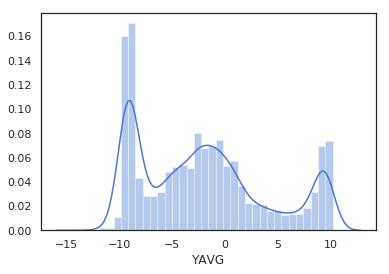

In [31]:
_ = sns.distplot(all_phone_accel['YAVG'])

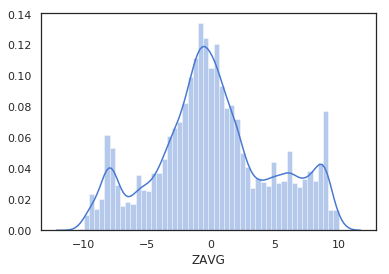

In [32]:
_ = sns.distplot(all_phone_accel['ZAVG'])

**Observation: bimodal nature - corresponding the the standing - sitting postures**

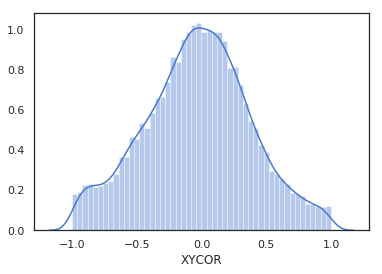

In [33]:
_ = sns.distplot(all_phone_accel['XYCOR'])

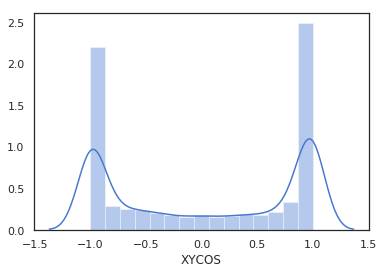

In [34]:
_ = sns.distplot(all_phone_accel['XYCOS'])

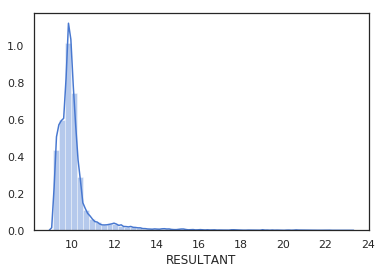

In [35]:
_ = sns.distplot(all_phone_accel['RESULTANT'])

**Observation: resultand reflects stability around force equilibrium (1g upwards, [9.8 m/sec^2])**

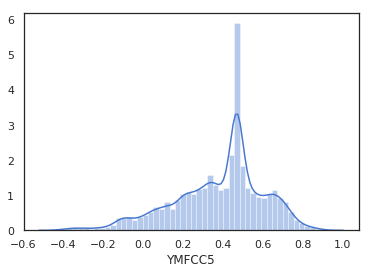

In [36]:
_ = sns.distplot(all_phone_accel['YMFCC5'])



---



# **Preprocessing of Input Dataset:**

---



<font size=4>**Dropping the Participant column:**</font>

The approach in this analysis will be to see all the participants as a closed united sample population.
The purpose of this analysis is not to inquire the inter participant variability.
Also, the participants number (44 in effect) is too small to significantly represent the variability of the general population.

Therefore, The participant column will be dropped:

In [37]:
all_phone_accel.drop('PARTICIPANT', axis = 1, inplace = True)


In [38]:
#all_phone_accel

<font size=4>**Allocating the test subset:**</font>

In [39]:
from sklearn.model_selection import train_test_split

y = all_phone_accel.ACTIVITY
X = all_phone_accel.drop('ACTIVITY', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    train_size = 0.75, 
                                                    test_size = 0.25,
                                                    shuffle = True, 
                                                    stratify = all_phone_accel.ACTIVITY)

In [40]:
X_train

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
10173,1.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,...,0.323764,0.319995,0.315883,-0.778665,0.933432,-0.756305,0.283357,-0.494664,-0.048936,9.55147
4149,0.025,0.080,0.655,0.235,0.005,0.000,0.0,0.0,0.0,0.0,...,0.446344,0.441148,0.435479,-0.763353,0.511430,-0.807051,-0.284062,-0.223418,-0.111315,9.73438
14668,0.000,0.000,0.000,0.000,1.000,0.000,0.0,0.0,0.0,0.0,...,0.348001,0.343950,0.339530,-0.999964,-0.999936,0.999958,0.225969,0.512814,0.089975,9.88018
12157,0.000,0.115,0.885,0.000,0.000,0.000,0.0,0.0,0.0,0.0,...,0.300201,0.296706,0.292893,-0.695656,0.697583,-0.999420,0.571739,-0.106267,0.074225,9.42927
20141,0.000,0.000,0.840,0.160,0.000,0.000,0.0,0.0,0.0,0.0,...,0.194638,0.192372,0.189900,0.969420,0.439882,0.529516,-0.286798,-0.373331,-0.021899,10.13620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10515,0.000,0.000,1.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,...,0.364373,0.360131,0.355503,0.999592,0.999665,0.999796,-0.241039,0.156174,-0.820659,9.33208
18312,0.070,0.390,0.370,0.135,0.025,0.010,0.0,0.0,0.0,0.0,...,0.489881,0.484178,0.477956,0.173017,0.055585,0.299649,0.219863,0.014320,0.208970,10.06690
20624,0.000,0.000,0.000,0.015,0.950,0.035,0.0,0.0,0.0,0.0,...,0.422678,0.417757,0.412389,0.874305,-0.993522,-0.863473,0.164756,0.422014,0.258377,10.06400
3918,0.000,0.000,0.000,0.000,1.000,0.000,0.0,0.0,0.0,0.0,...,0.429448,0.424449,0.418995,-0.986774,-0.999910,0.987423,0.755486,-0.546094,-0.831801,10.10890


In [41]:
y_train

10173    P
4149     A
14668    F
12157    Q
20141    O
        ..
10515    L
18312    P
20624    R
3918     J
19041    K
Name: ACTIVITY, Length: 15487, dtype: object

In [42]:
X_test

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
7083,0.505,0.495,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.194890,0.192621,0.190145,-0.961255,0.882083,-0.947066,0.546295,-0.353722,-0.062349,9.97103
16905,0.000,0.000,0.00,1.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.457890,0.452559,0.446744,-0.999546,-0.999740,0.999628,-0.211345,0.588642,-0.049705,10.33600
20551,0.000,0.000,0.00,0.025,0.150,0.665,0.130,0.02,0.01,0.0,...,0.478574,0.473002,0.466924,0.356746,0.838052,0.460348,-0.272872,-0.301673,0.221283,9.74916
14989,1.000,0.000,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.133321,0.131769,0.130076,0.999927,-0.999485,-0.999567,-0.263947,0.675801,-0.122525,9.80208
18331,0.000,0.000,0.00,0.000,0.000,1.000,0.000,0.00,0.00,0.0,...,0.278952,0.275704,0.272161,0.999960,0.999957,0.999947,-0.320574,-0.472273,0.061633,9.77034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8226,1.000,0.000,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.308828,0.305232,0.301310,0.999859,-0.999768,-0.999934,-0.132329,0.487618,0.137324,9.77343
11070,0.000,0.000,0.00,0.995,0.005,0.000,0.000,0.00,0.00,0.0,...,0.170070,0.168090,0.165930,0.996163,-0.982657,-0.987712,-0.523508,0.129205,-0.292853,9.80429
8600,0.025,0.355,0.50,0.090,0.015,0.010,0.005,0.00,0.00,0.0,...,0.428466,0.423478,0.418036,-0.316121,0.171345,-0.168198,-0.062177,0.145121,-0.279903,9.98937
18021,0.275,0.210,0.26,0.155,0.070,0.025,0.005,0.00,0.00,0.0,...,0.667318,0.659549,0.651074,0.081114,0.074475,0.143768,0.122991,0.078452,0.070756,11.19540


In [43]:
y_test

7083     E
16905    Q
20551    M
14989    F
18331    Q
        ..
8226     Q
11070    E
8600     O
18021    B
7739     O
Name: ACTIVITY, Length: 5163, dtype: object

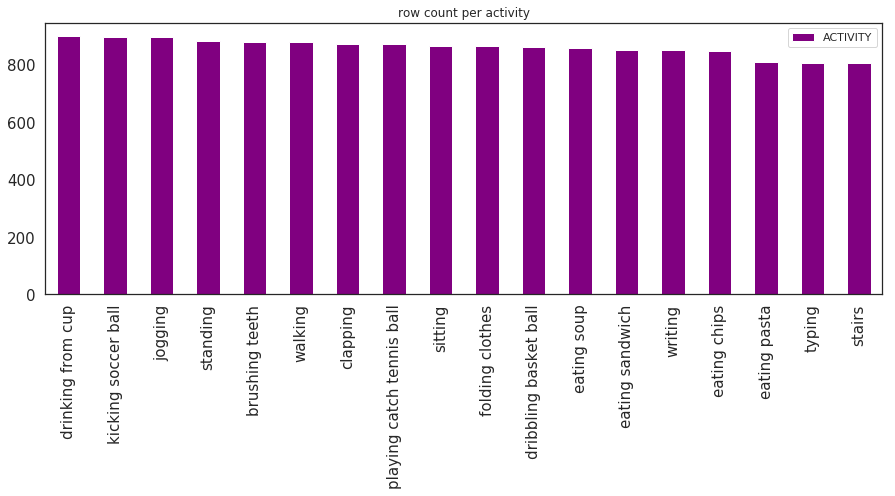

In [44]:
_ = y_train.map(activity_codes_mapping).value_counts().plot(kind = 'bar', figsize = (15,5), color = 'purple', title = 'row count per activity', legend = True, fontsize = 15)

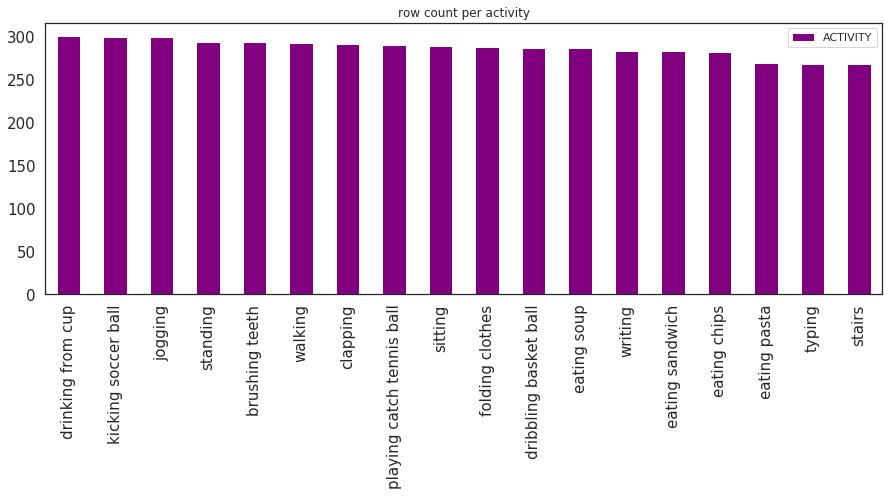

In [45]:
_ = y_test.map(activity_codes_mapping).value_counts().plot(kind = 'bar', figsize = (15,5), color = 'purple', title = 'row count per activity', legend = True, fontsize = 15)

**Observation: both train and test class labels sets are fairly balanced**

Temporarily re-unite the train lables to train dataset for further preprocessing steps.

In [46]:
X_train.insert(0, 'Y', y_train)

In [47]:
X_train

,Y,X0,X1,X2,X3,X4,X5,X6,X7,X8,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
10173,P,1.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,...,0.323764,0.319995,0.315883,-0.778665,0.933432,-0.756305,0.283357,-0.494664,-0.048936,9.55147
4149,A,0.025,0.080,0.655,0.235,0.005,0.000,0.0,0.0,0.0,...,0.446344,0.441148,0.435479,-0.763353,0.511430,-0.807051,-0.284062,-0.223418,-0.111315,9.73438
14668,F,0.000,0.000,0.000,0.000,1.000,0.000,0.0,0.0,0.0,...,0.348001,0.343950,0.339530,-0.999964,-0.999936,0.999958,0.225969,0.512814,0.089975,9.88018
12157,Q,0.000,0.115,0.885,0.000,0.000,0.000,0.0,0.0,0.0,...,0.300201,0.296706,0.292893,-0.695656,0.697583,-0.999420,0.571739,-0.106267,0.074225,9.42927
20141,O,0.000,0.000,0.840,0.160,0.000,0.000,0.0,0.0,0.0,...,0.194638,0.192372,0.189900,0.969420,0.439882,0.529516,-0.286798,-0.373331,-0.021899,10.13620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10515,L,0.000,0.000,1.000,0.000,0.000,0.000,0.0,0.0,0.0,...,0.364373,0.360131,0.355503,0.999592,0.999665,0.999796,-0.241039,0.156174,-0.820659,9.33208
18312,P,0.070,0.390,0.370,0.135,0.025,0.010,0.0,0.0,0.0,...,0.489881,0.484178,0.477956,0.173017,0.055585,0.299649,0.219863,0.014320,0.208970,10.06690
20624,R,0.000,0.000,0.000,0.015,0.950,0.035,0.0,0.0,0.0,...,0.422678,0.417757,0.412389,0.874305,-0.993522,-0.863473,0.164756,0.422014,0.258377,10.06400
3918,J,0.000,0.000,0.000,0.000,1.000,0.000,0.0,0.0,0.0,...,0.429448,0.424449,0.418995,-0.986774,-0.999910,0.987423,0.755486,-0.546094,-0.831801,10.10890


<font size="4">**Outliers detection:
    in XPEAK, YPEAK, ZPEAK by inspection of the histogram/boxplot:**</font>

---



From histograms inspection it seems that there are few extreme values in the PEAK related features, so, they will be removed:

### **XPEAK**


In [48]:
upper_threshold_XPEAK = X_train.XPEAK.mean() + 9*X_train.XPEAK.std()
upper_threshold_XPEAK

177.148224397732

In [49]:
X_train.XPEAK.max()

179.0

In [50]:
#X_train

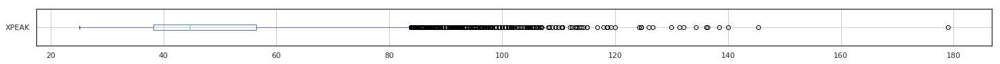

In [51]:
_ = X_train.boxplot(column=['XPEAK'], figsize=[25,1], vert=False)

In [52]:
X_train = X_train[X_train.XPEAK < upper_threshold_XPEAK].copy()

In [53]:
#X_train

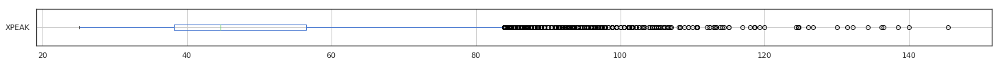

In [54]:
_ = X_train.boxplot(column=['XPEAK'], figsize=[25,1], vert=False)

### **YPEAK**


In [55]:
upper_threshold_YPEAK = X_train.YPEAK.mean() + 9*X_train.YPEAK.std()
upper_threshold_YPEAK

185.18103285243274

In [56]:
X_train.YPEAK.max()

197.778

In [57]:
#X_train

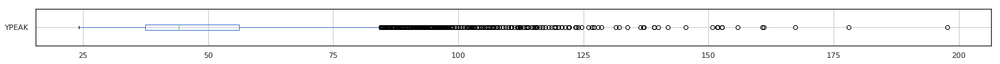

In [58]:
_ = X_train.boxplot(column=['YPEAK'], figsize=[25,1], vert=False)

In [59]:
X_train = X_train[X_train.YPEAK < upper_threshold_YPEAK].copy()

In [60]:
#X_train

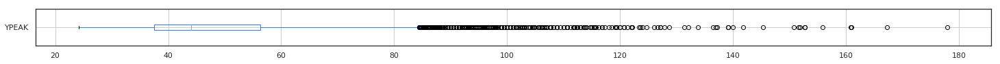

In [61]:
_ = X_train.boxplot(column=['YPEAK'], figsize=[25,1], vert=False)

### **ZPEAK**


In [62]:
upper_threshold_ZPEAK = X_train.ZPEAK.mean() + 9*X_train.ZPEAK.std()
upper_threshold_ZPEAK

151.6323769799148

In [63]:
X_train.ZPEAK.max()


173.0

In [64]:
#X_train

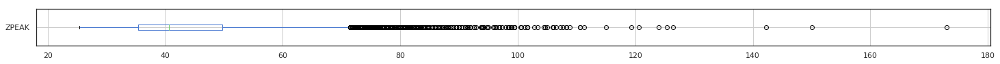

In [65]:
_ = X_train.boxplot(column=['ZPEAK'], figsize=[25,1], vert=False)

In [66]:
X_train = X_train[X_train.ZPEAK < upper_threshold_ZPEAK].copy()

In [67]:
#X_train

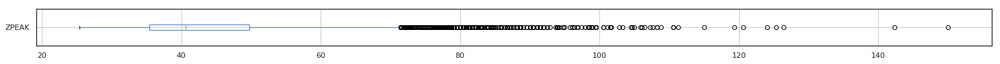

In [68]:
_ = X_train.boxplot(column=['ZPEAK'], figsize=[25,1], vert=False)

Now, let's separate out again y_train:

In [69]:
y_train = X_train['Y']

In [70]:
y_train

10173    P
4149     A
14668    F
12157    Q
20141    O
        ..
10515    L
18312    P
20624    R
3918     J
19041    K
Name: Y, Length: 15484, dtype: object

In [71]:
X_train.drop(['Y'], axis = 1, inplace = True)

In [72]:
#X_train


# **Scaling:**

rescaling will now be applied to the features that their absolute values exceed the range of ~1

In [73]:
from sklearn.preprocessing import MaxAbsScaler

scaling_transformer = MaxAbsScaler().fit(X_train[['XAVG', 'YAVG', 'ZAVG', 'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV', 'RESULTANT']])

In [74]:
X_train[['XAVG', 'YAVG', 'ZAVG', 'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV', 'RESULTANT']] = scaling_transformer.transform(X_train[['XAVG', 'YAVG', 'ZAVG', 'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV', 'RESULTANT']])

In [75]:
#X_train

Applying this scaling on the test set as well:

In [76]:
X_test = X_test.copy()

In [77]:
X_test[['XAVG', 'YAVG', 'ZAVG', 'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV', 'RESULTANT']] = scaling_transformer.transform(X_test[['XAVG', 'YAVG', 'ZAVG', 'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV', 'RESULTANT']])

In [78]:
X_test

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
7083,0.505,0.495,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.194890,0.192621,0.190145,-0.961255,0.882083,-0.947066,0.546295,-0.353722,-0.062349,0.430623
16905,0.000,0.000,0.00,1.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.457890,0.452559,0.446744,-0.999546,-0.999740,0.999628,-0.211345,0.588642,-0.049705,0.446385
20551,0.000,0.000,0.00,0.025,0.150,0.665,0.130,0.02,0.01,0.0,...,0.478574,0.473002,0.466924,0.356746,0.838052,0.460348,-0.272872,-0.301673,0.221283,0.421041
14989,1.000,0.000,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.133321,0.131769,0.130076,0.999927,-0.999485,-0.999567,-0.263947,0.675801,-0.122525,0.423326
18331,0.000,0.000,0.00,0.000,0.000,1.000,0.000,0.00,0.00,0.0,...,0.278952,0.275704,0.272161,0.999960,0.999957,0.999947,-0.320574,-0.472273,0.061633,0.421956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8226,1.000,0.000,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.308828,0.305232,0.301310,0.999859,-0.999768,-0.999934,-0.132329,0.487618,0.137324,0.422089
11070,0.000,0.000,0.00,0.995,0.005,0.000,0.000,0.00,0.00,0.0,...,0.170070,0.168090,0.165930,0.996163,-0.982657,-0.987712,-0.523508,0.129205,-0.292853,0.423422
8600,0.025,0.355,0.50,0.090,0.015,0.010,0.005,0.00,0.00,0.0,...,0.428466,0.423478,0.418036,-0.316121,0.171345,-0.168198,-0.062177,0.145121,-0.279903,0.431415
18021,0.275,0.210,0.26,0.155,0.070,0.025,0.005,0.00,0.00,0.0,...,0.667318,0.659549,0.651074,0.081114,0.074475,0.143768,0.122991,0.078452,0.070756,0.483500


resetting the indices: 

In [79]:
X_train.reset_index(drop = True, inplace = True)
X_train

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
0,1.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,...,0.323764,0.319995,0.315883,-0.778665,0.933432,-0.756305,0.283357,-0.494664,-0.048936,0.412503
1,0.025,0.080,0.655,0.235,0.005,0.000,0.0,0.0,0.0,0.0,...,0.446344,0.441148,0.435479,-0.763353,0.511430,-0.807051,-0.284062,-0.223418,-0.111315,0.420403
2,0.000,0.000,0.000,0.000,1.000,0.000,0.0,0.0,0.0,0.0,...,0.348001,0.343950,0.339530,-0.999964,-0.999936,0.999958,0.225969,0.512814,0.089975,0.426699
3,0.000,0.115,0.885,0.000,0.000,0.000,0.0,0.0,0.0,0.0,...,0.300201,0.296706,0.292893,-0.695656,0.697583,-0.999420,0.571739,-0.106267,0.074225,0.407226
4,0.000,0.000,0.840,0.160,0.000,0.000,0.0,0.0,0.0,0.0,...,0.194638,0.192372,0.189900,0.969420,0.439882,0.529516,-0.286798,-0.373331,-0.021899,0.437756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15479,0.000,0.000,1.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,...,0.364373,0.360131,0.355503,0.999592,0.999665,0.999796,-0.241039,0.156174,-0.820659,0.403028
15480,0.070,0.390,0.370,0.135,0.025,0.010,0.0,0.0,0.0,0.0,...,0.489881,0.484178,0.477956,0.173017,0.055585,0.299649,0.219863,0.014320,0.208970,0.434763
15481,0.000,0.000,0.000,0.015,0.950,0.035,0.0,0.0,0.0,0.0,...,0.422678,0.417757,0.412389,0.874305,-0.993522,-0.863473,0.164756,0.422014,0.258377,0.434638
15482,0.000,0.000,0.000,0.000,1.000,0.000,0.0,0.0,0.0,0.0,...,0.429448,0.424449,0.418995,-0.986774,-0.999910,0.987423,0.755486,-0.546094,-0.831801,0.436577


In [80]:
X_test.reset_index(drop = True, inplace = True)
X_test

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
0,0.505,0.495,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.194890,0.192621,0.190145,-0.961255,0.882083,-0.947066,0.546295,-0.353722,-0.062349,0.430623
1,0.000,0.000,0.00,1.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.457890,0.452559,0.446744,-0.999546,-0.999740,0.999628,-0.211345,0.588642,-0.049705,0.446385
2,0.000,0.000,0.00,0.025,0.150,0.665,0.130,0.02,0.01,0.0,...,0.478574,0.473002,0.466924,0.356746,0.838052,0.460348,-0.272872,-0.301673,0.221283,0.421041
3,1.000,0.000,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.133321,0.131769,0.130076,0.999927,-0.999485,-0.999567,-0.263947,0.675801,-0.122525,0.423326
4,0.000,0.000,0.00,0.000,0.000,1.000,0.000,0.00,0.00,0.0,...,0.278952,0.275704,0.272161,0.999960,0.999957,0.999947,-0.320574,-0.472273,0.061633,0.421956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5158,1.000,0.000,0.00,0.000,0.000,0.000,0.000,0.00,0.00,0.0,...,0.308828,0.305232,0.301310,0.999859,-0.999768,-0.999934,-0.132329,0.487618,0.137324,0.422089
5159,0.000,0.000,0.00,0.995,0.005,0.000,0.000,0.00,0.00,0.0,...,0.170070,0.168090,0.165930,0.996163,-0.982657,-0.987712,-0.523508,0.129205,-0.292853,0.423422
5160,0.025,0.355,0.50,0.090,0.015,0.010,0.005,0.00,0.00,0.0,...,0.428466,0.423478,0.418036,-0.316121,0.171345,-0.168198,-0.062177,0.145121,-0.279903,0.431415
5161,0.275,0.210,0.26,0.155,0.070,0.025,0.005,0.00,0.00,0.0,...,0.667318,0.659549,0.651074,0.081114,0.074475,0.143768,0.122991,0.078452,0.070756,0.483500


In [81]:
y_train.reset_index(drop = True, inplace = True)
y_train

0        P
1        A
2        F
3        Q
4        O
        ..
15479    L
15480    P
15481    R
15482    J
15483    K
Name: Y, Length: 15484, dtype: object

In [82]:
y_test.reset_index(drop = True, inplace = True)
y_test

0       E
1       Q
2       M
3       F
4       Q
       ..
5158    Q
5159    E
5160    O
5161    B
5162    O
Name: ACTIVITY, Length: 5163, dtype: object

## **Special visualization of triples of features clustering pattern**

<font size="4">Owing to the fact that the features in the transformed dataset can, logically, be grouped in triples (corresponding to the X, Y, Z geometric axes), there is an opportunity to assess the capability of the features to separate the associated classes by visualization via a rotating perspective plot. (via plotly.express library)<font>

<font size="4">**Comment**: the graph data for the *individual* example participants were fetched directly from the arff files and not taken fron the above processed dataframe all_phone_accel (for simplicity)</font>


---

<font size="4">Example 1: Participant 23 phone accel Features: XAVG  YAVG  ZAVG</font>


---

In [83]:
fn = r'/kaggle/input/wisdm-dataset/wisdm-dataset/arff_files/phone/accel/data_1623_accel_phone.arff'
par_23_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_23_df['ACT'] = par_23_df['ACTIVITY'].map(activity_codes_mapping)

In [84]:
import plotly.express as px

fig = px.scatter_3d(par_23_df, x='XAVG', y='YAVG', z='ZAVG', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()





---

<font size="4">Example 2: Participant 40 phone accel Features: XABSULTEV  YABSULDEV  ZABSULDEV</font>


---





In [85]:
fn = r'/kaggle/input/wisdm-dataset/wisdm-dataset/arff_files/phone/accel/data_1640_accel_phone.arff'
par_40_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_40_df['ACT'] = par_40_df['ACTIVITY'].map(activity_codes_mapping)

In [86]:
import plotly.express as px

fig = px.scatter_3d(par_40_df, x='XABSOLDEV', y='YABSOLDEV', z='ZABSOLDEV', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

---

<font size="4">Example 3: Participant 35 phone accel Features: XMFCC7  YMFCC7  ZMFCC7</font>


---

In [87]:
fn = r'/kaggle/input/wisdm-dataset/wisdm-dataset/arff_files/phone/accel/data_1635_accel_phone.arff'
par_35_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_35_df['ACT'] = par_35_df['ACTIVITY'].map(activity_codes_mapping)

In [88]:
import plotly.express as px

fig = px.scatter_3d(par_35_df, x='XMFCC7', y='YMFCC7', z='ZMFCC7', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height = 1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

---

<font size="4">Example 4: Participant 0 phone accel Features: X5  Y5  Z5</font>


---

In [89]:
fn = r'/kaggle/input/wisdm-dataset/wisdm-dataset/arff_files/phone/accel/data_1640_accel_phone.arff'
par_0_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_0_df['ACT'] = par_0_df['ACTIVITY'].map(activity_codes_mapping)

In [90]:
import plotly.express as px

fig = px.scatter_3d(par_0_df, x='X5', y='Y5', z='Z5', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

---

<font size="4">Example 5: Participant 0 phone accel Features: XAVG YAVG ZAVG</font>


---

In [91]:
import plotly.express as px

fig = px.scatter_3d(par_0_df, x='XAVG', y='YAVG', z='ZAVG', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

---

<font size="4">Examole 6: All participants:  phone accel  features: XAVG  YAVG  ZAVG</font>


---

In [92]:
import plotly.express as px

all_pa = all_phone_accel.copy()
all_pa['ACT'] = all_pa['ACTIVITY'].map(activity_codes_mapping)

fig = px.scatter_3d(all_pa, x='XAVG', y='YAVG', z='ZAVG', color ='ACT', color_discrete_map = activity_color_map)
#fig = px.scatter_3d(all_pa, x='XABSOLDEV', y='YABSOLDEV', z='ZABSOLDEV', color ='ACT')
#fig = px.scatter_3d(all_pa, x='XYCOS', y='XZCOS', z='YZCOS', color ='ACTIVITY')
#fig = px.scatter_3d(all_pa, x='X9', y='Y9', z='Z9', color ='ACT', color_discrete_map = activity_color_map)
#fig = px.scatter_3d(all_pa, x='XYCOR', y='XZCOR', z='YZCOR', color ='ACTIVITY')

#fig = px.scatter_3d(all_pa, x='XMFCC7', y='YMFCC7', z='ZMFCC7', color ='ACTIVITY')

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=1800,
                    height = 1000,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()


---

<font size="4">Examole 7: All participants:  phone accel  features: XMFCC7  YMFCC7  ZMFCC7</font>


---

In [93]:
import plotly.express as px

fig = px.scatter_3d(all_pa, x='XMFCC7', y='YMFCC7', z='ZMFCC7', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=1800,
                    height = 1000,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

fig.show()

---
# Visualizing the clustering pattern via t-SNE algorithm (for individual participants)    

---

In [94]:
from matplotlib import pyplot as plt
from sklearn.manifold import TSNE

def plot_tSNE(X, y, fig_size):
    tsne = TSNE(n_components=2, random_state=300)
    X_2d = tsne.fit_transform(X)
    target_ids = ('A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'O', 'P', 'Q', 'R', 'S' )

    plt.figure(figsize=(fig_size, fig_size))
    colors = 'lime', 'red', 'blue', 'orange', 'yellow', 'lightgreen', 'greenyellow', 'magenta', 'gold', 'cyan', 'purple', 'lightgreen', 'violet', 'limegreen', 'deepskyblue', 'mediumspringgreen', 'plum', 'olive'

    for i, c, label in zip(target_ids, colors, tuple(activity_codes_mapping.values())):
        plt.scatter(X_2d[y == i, 0], X_2d[y == i, 1], c=c, label=label)

    plt.legend()
    plt.show()

---
<font size="4">Participant 23: (1623)</font>

---

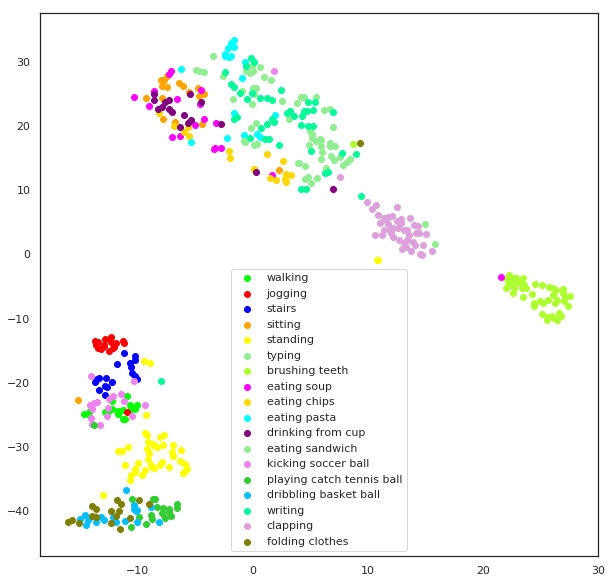

In [95]:
yy = par_23_df.ACTIVITY
XX = par_23_df.drop(['ACTIVITY','PARTICIPANT','ACT','XSTANDDEV','YSTANDDEV','ZSTANDDEV','XVAR','YVAR','ZVAR'], axis = 1)
plot_tSNE(XX, yy, 10)

---
<font size="4">Participant 40: (1640)</font>

---

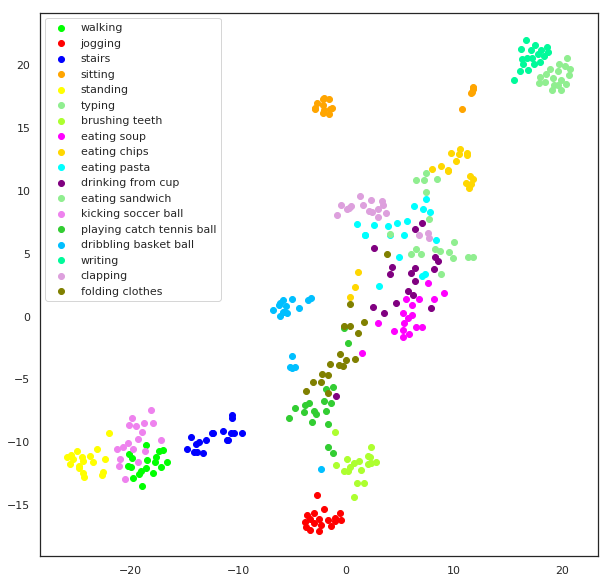

In [96]:
yy = par_40_df.ACTIVITY
XX = par_40_df.drop(['ACTIVITY','PARTICIPANT','ACT','XSTANDDEV','YSTANDDEV','ZSTANDDEV','XVAR','YVAR','ZVAR'], axis = 1)
plot_tSNE(XX, yy, 10)

---
<font size="4">Participant 35: (1635)</size>

---

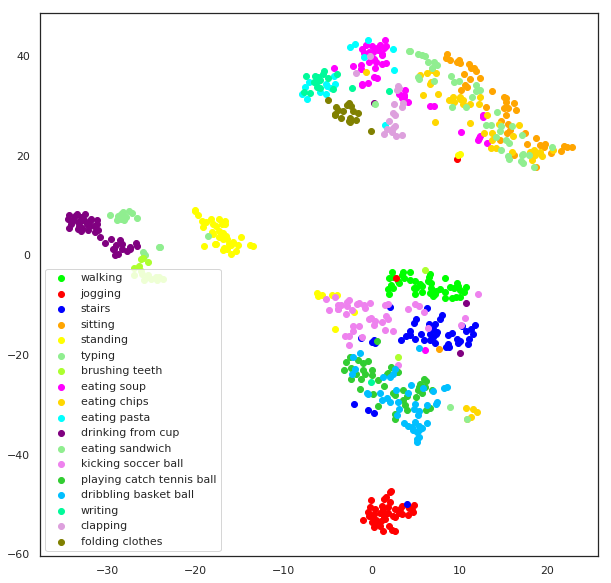

In [97]:
yy = par_35_df.ACTIVITY
XX = par_35_df.drop(['ACTIVITY','PARTICIPANT','ACT','XSTANDDEV','YSTANDDEV','ZSTANDDEV','XVAR','YVAR','ZVAR'], axis = 1)
plot_tSNE(XX, yy, 10)

---
<font size="4">Participant 0: (1600)</font>

---

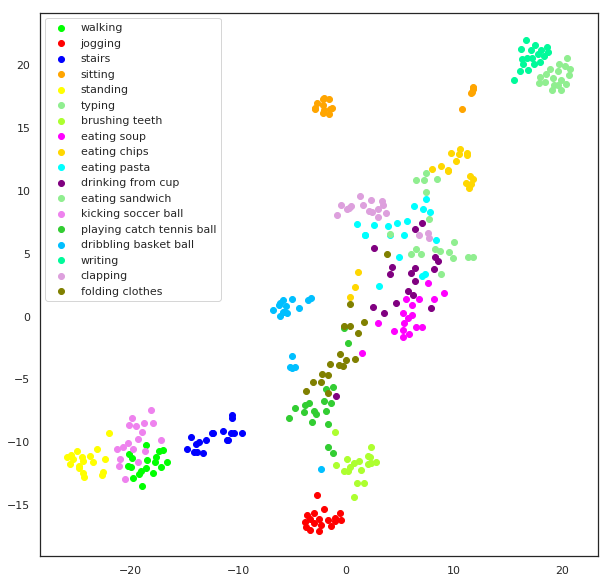

In [98]:
yy = par_0_df.ACTIVITY
XX = par_0_df.drop(['ACTIVITY','PARTICIPANT','ACT','XSTANDDEV','YSTANDDEV','ZSTANDDEV','XVAR','YVAR','ZVAR'], axis = 1)
plot_tSNE(XX, yy, 10)

---
# **Application of Machine Learning Classification Models:**

---

In [99]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time

# For the tree models
from sklearn.metrics import log_loss
from sklearn.tree import DecisionTreeClassifier, export_graphviz

from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
import warnings


#!pip install pydot

# For the tree visualization
import pydot
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz

/opt/conda/lib/python3.6/site-packages/sklearn/externals/six.py:31: DeprecationWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).



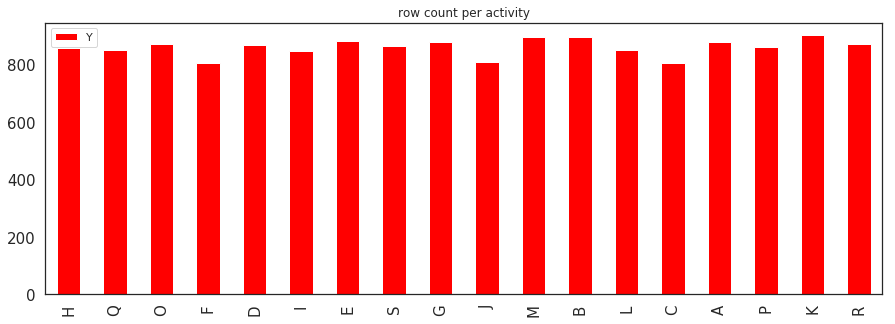

In [100]:
_ = y_train.value_counts(sort = False).plot(kind = 'bar', figsize = (15,5), color = 'red', title = 'row count per activity', legend = True, fontsize = 15)

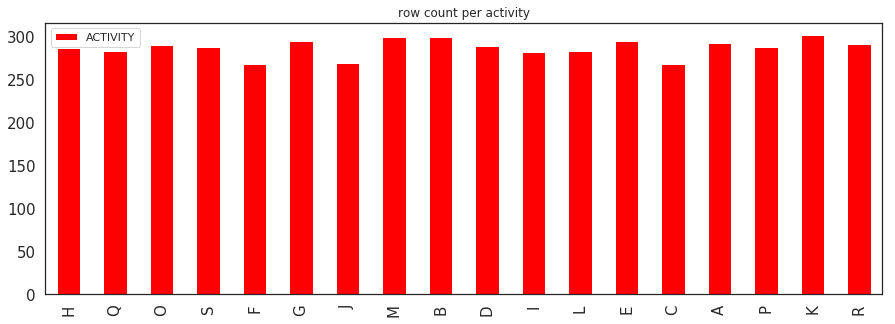

In [101]:
_ = y_test.value_counts(sort = False).plot(kind = 'bar', figsize = (15,5), color = 'red', title = 'row count per activity', legend = True, fontsize = 15)

**Observation: both test and train series seem adequately balanced, pertaining the Activity labels representation**

---
# **Decision Tree Classification Model:**
---

In [102]:
def visualize_tree(model, md=5, width=800):
    dot_data = StringIO()  
    export_graphviz(model, out_file=dot_data, feature_names=X_train.columns, max_depth=md)
    graph = pydot.graph_from_dot_data(dot_data.getvalue())[0]  
    return Image(graph.create_png(), width=width) 

Cross Validator for the Grid Search:  StratifiedShuffleSplit

In [103]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GroupKFold

my_cv = StratifiedShuffleSplit(n_splits=5, train_size=0.7, test_size=0.3)

In [104]:
dt_classifier = DecisionTreeClassifier()

In [105]:
my_param_grid = {'min_samples_leaf': [6, 10, 20, 40],
                 'min_weight_fraction_leaf': [0.01, 0.02, 0.05],
                 'criterion': ['entropy'],
                 'min_impurity_decrease': [1e-2, 7e-3]}

In [106]:
dt_model_gs = GridSearchCV(estimator=dt_classifier, 
                           param_grid=my_param_grid, 
                           cv=my_cv, 
                           scoring='accuracy',
                           verbose = 0,
                           return_train_score = True)

In [107]:
dt_model_gs.fit(X_train, y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'cr

In [108]:
dt_model_gs.best_params_

{'criterion': 'entropy',
 'min_impurity_decrease': 0.007,
 'min_samples_leaf': 6,
 'min_weight_fraction_leaf': 0.01}

In [109]:
dt_best_classifier = dt_model_gs.best_estimator_


In [110]:
dt_model_gs.cv_results_

{'mean_fit_time': array([3.09819798, 2.60388646, 1.80148816, 3.09701195, 2.61395831,
        1.80197911, 3.11212916, 2.59701662, 1.80221462, 3.10849791,
        2.58882141, 1.79962482, 3.22369194, 2.60839171, 1.81849256,
        3.21217265, 2.62360759, 1.8050725 , 3.21378803, 2.6327157 ,
        1.80280504, 3.22491689, 2.62030864, 1.80939493]),
 'std_fit_time': array([0.03946363, 0.04391777, 0.04377582, 0.03638332, 0.03781605,
        0.04366719, 0.06510106, 0.04215028, 0.04267175, 0.0369629 ,
        0.05206445, 0.04565527, 0.06467027, 0.04485775, 0.01331001,
        0.06363431, 0.0489387 , 0.03989543, 0.06939324, 0.06515104,
        0.04410663, 0.07214463, 0.05037074, 0.04381408]),
 'mean_score_time': array([0.00779748, 0.00747547, 0.0074131 , 0.00752439, 0.00749626,
        0.00740199, 0.00754919, 0.00748858, 0.00737643, 0.00772882,
        0.00752816, 0.00739465, 0.00756869, 0.00766826, 0.00749936,
        0.00752511, 0.00758095, 0.00754857, 0.00757608, 0.00763164,
        0.007442

Review the constructed optimal tree model:

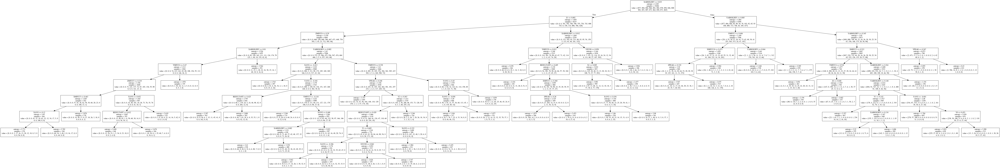

In [111]:
visualize_tree(dt_best_classifier, md=20, width=2000)

In [112]:
dt_best_classifier.get_params()

{'class_weight': None,
 'criterion': 'entropy',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.007,
 'min_impurity_split': None,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.01,
 'presort': False,
 'random_state': None,
 'splitter': 'best'}

In [113]:
dt_best_classifier.get_depth()

10

In [114]:
dt_best_classifier.get_n_leaves()

52

In [115]:
scores = cross_val_score(dt_best_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[0.34373654756780025,
 0.3435213086526044,
 0.33835557468790356,
 0.35987946620749034,
 0.3420146362462333]

In [116]:
dt_best_classifier.score(X_train, y_train)

0.364892792560062

<font size="4">Applying model to train set first, just to verify that there is no substantial overfitting</font>

In [117]:
#y_train

In [118]:
y_train_pred = dt_best_classifier.predict(X_train)
#print(pd.DataFrame(y_train_pred))

In [119]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.364892792560062

In [120]:
log_loss(y_train, dt_best_classifier.predict_proba(X_train))

1.7863696919574485

<font size="4">**Applying the best dt model to the test set:**</font>

In [121]:
y_test

0       E
1       Q
2       M
3       F
4       Q
       ..
5158    Q
5159    E
5160    O
5161    B
5162    O
Name: ACTIVITY, Length: 5163, dtype: object

In [122]:
y_test_pred = dt_best_classifier.predict(X_test)
print(pd.DataFrame(y_test_pred))

      0
0     S
1     Q
2     M
3     Q
4     L
...  ..
5158  Q
5159  S
5160  M
5161  B
5162  S

[5163 rows x 1 columns]


In [123]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred)
#                      y_pred=y_test_pred, normalize = 'true')
    
cm_act = pd.DataFrame(cm,
                      index=dt_best_classifier.classes_,
                      columns=dt_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,238,1,18,0,0,0,0,0,0,0,3,0,10,0,13,0,0,9
jogging,29,265,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3
stairs,145,8,60,0,0,0,0,0,0,0,0,0,31,0,12,0,0,12
sitting,1,2,1,50,11,35,24,1,7,2,36,22,1,8,1,25,51,11
standing,0,2,0,3,152,16,23,0,0,12,5,14,1,9,0,4,2,51
typing,1,1,0,14,11,96,12,0,8,6,20,12,5,3,0,51,18,10
brushing teeth,6,1,1,3,19,18,102,8,0,0,21,29,2,6,2,18,31,27
eating soup,0,0,0,28,13,6,24,17,2,3,30,46,2,7,1,17,62,28
eating chips,3,0,0,3,15,33,20,3,31,7,15,50,2,6,0,20,51,23
eating pasta,1,0,0,4,16,23,6,12,9,20,25,31,1,8,0,22,63,28


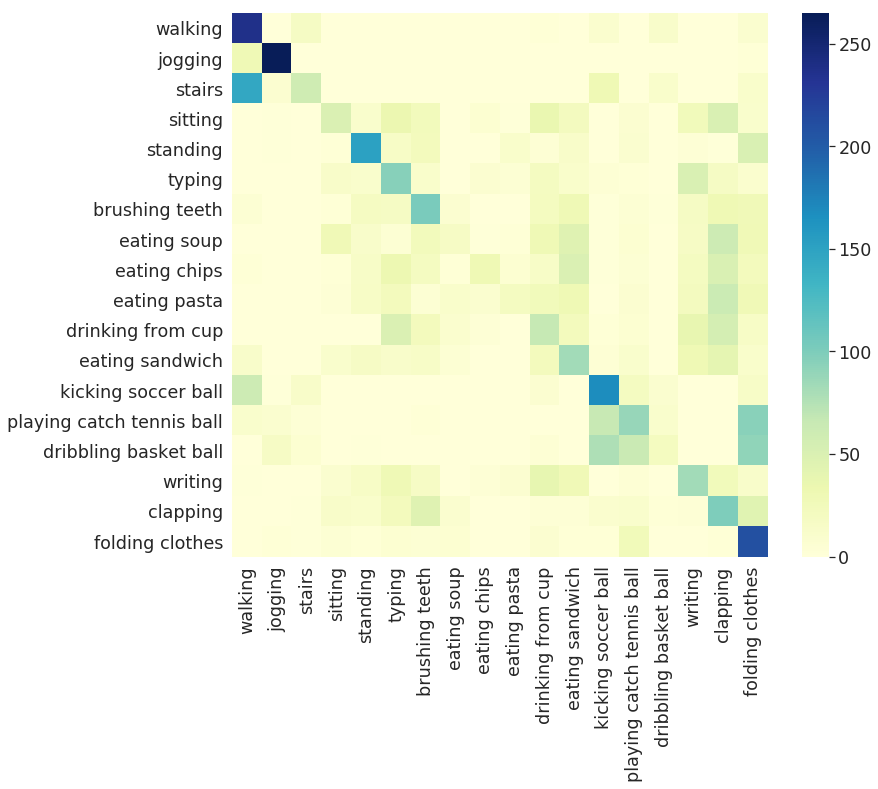

In [124]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
#sns.set(font_scale=1.6)   
_ = sns.heatmap(cm_act, cmap="YlGnBu")
#sns.heatmap(cm_act, cmap="Greens")

In [125]:
sns.set(font_scale=1.2)

In [126]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.815068
jogging,0.886288
stairs,0.223881
sitting,0.173010
standing,0.517007
typing,0.358209
brushing teeth,0.346939
eating soup,0.059441
eating chips,0.109929
eating pasta,0.074349


In [127]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.46      0.82      0.59       292
           B       0.85      0.89      0.87       299
           C       0.54      0.22      0.32       268
           D       0.34      0.17      0.23       289
           E       0.53      0.52      0.52       294
           F       0.27      0.36      0.31       268
           G       0.32      0.35      0.33       294
           H       0.23      0.06      0.09       286
           I       0.47      0.11      0.18       282
           J       0.33      0.07      0.12       269
           K       0.22      0.22      0.22       301
           L       0.24      0.29      0.26       283
           M       0.43      0.56      0.49       299
           O       0.32      0.31      0.31       290
           P       0.28      0.07      0.12       287
           Q       0.27      0.29      0.28       283
           R       0.20      0.34      0.25       291
           S       0.30    

In [128]:
accuracy_score(y_true=y_test, y_pred=y_test_pred)

0.3587061785783459

In [129]:
log_loss(y_test, dt_best_classifier.predict_proba(X_test))

2.028744975032476

---
# **Random Forest Classification Model:**
---

In [130]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GroupKFold
from sklearn.ensemble import RandomForestClassifier

In [131]:
rf_classifier = RandomForestClassifier(**dt_model_gs.best_params_)

In [132]:
my_param_grid = {'bootstrap': [True], 
                 'n_estimators': [50, 100, 200], 
                 'oob_score': [True, False], 
                 'warm_start': [True, False]}

In [133]:
rf_model_gs = GridSearchCV(estimator = rf_classifier, 
                           param_grid = my_param_grid, 
                           scoring = 'accuracy',
                           cv = my_cv)

In [134]:
rf_model_gs.fit(X_train, y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='entropy',
                                              max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.007,
                                              min_impurity_split=None,
                                              min_samples_leaf=6,
                                              min_samp...=2,
                                              min_weight_fraction_leaf=0.01,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
   

In [135]:
rf_best_classifier = rf_model_gs.best_estimator_

In [136]:
rf_model_gs.cv_results_

{'mean_fit_time': array([11.29743443, 11.34265432, 11.23858919, 11.16386056, 22.54376335,
        22.56212673, 22.24618826, 22.25708909, 45.31599679, 45.23626075,
        44.5557116 , 44.37095146]),
 'std_fit_time': array([0.10764877, 0.08733122, 0.03776061, 0.17272775, 0.09723915,
        0.22700164, 0.28530169, 0.14604932, 0.49900987, 0.15822682,
        0.22526686, 0.12060339]),
 'mean_score_time': array([0.05375252, 0.04954095, 0.05362082, 0.05461726, 0.09531803,
        0.09577365, 0.09533911, 0.10269523, 0.18276243, 0.18286624,
        0.18791418, 0.18151307]),
 'std_score_time': array([0.00356751, 0.00093039, 0.00112843, 0.00229513, 0.0026736 ,
        0.0024221 , 0.00222581, 0.00947746, 0.0050921 , 0.00355417,
        0.01081161, 0.00651376]),
 'param_bootstrap': masked_array(data=[True, True, True, True, True, True, True, True, True,
                    True, True, True],
              mask=[False, False, False, False, False, False, False, False,
                    False, Fal

In [137]:
rf_best_classifier.get_params()

{'bootstrap': True,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.007,
 'min_impurity_split': None,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.01,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': True,
 'random_state': None,
 'verbose': 0,
 'warm_start': True}

In [138]:
scores = cross_val_score(rf_best_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[0.4569522169608265,
 0.4829961256995265,
 0.45350839431769263,
 0.4614722341799397,
 0.4597503228583728]

<font size="4">Applying model to train set first, just to verify that there is no substantial overfitting</font>

In [139]:
y_train_pred = rf_best_classifier.predict(X_train)
#print(pd.DataFrame(y_train_pred))

In [140]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.48947300439163005

In [141]:
log_loss(y_train, dt_best_classifier.predict_proba(X_train))

1.7863696919574485

<font size="4">Applying the best rf model on the test set:</font>

In [142]:
y_test

0       E
1       Q
2       M
3       F
4       Q
       ..
5158    Q
5159    E
5160    O
5161    B
5162    O
Name: ACTIVITY, Length: 5163, dtype: object

In [143]:
y_test_pred = rf_best_classifier.predict(X_test)
print(pd.DataFrame(y_test_pred))

      0
0     S
1     Q
2     M
3     F
4     F
...  ..
5158  Q
5159  E
5160  M
5161  B
5162  S

[5163 rows x 1 columns]


In [144]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred)
#                      y_pred=y_test_pred, normalize = 'true')
    
cm_act = pd.DataFrame(cm,
                      index=rf_best_classifier.classes_,
                      columns=rf_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,180,19,71,0,0,0,0,0,0,0,0,0,18,0,1,0,0,3
jogging,17,277,3,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
stairs,70,22,145,0,0,0,0,0,0,0,0,0,26,2,1,0,0,2
sitting,4,1,2,111,9,15,11,5,14,2,49,7,1,1,2,20,22,13
standing,1,0,0,0,234,0,4,0,0,2,3,2,2,9,4,2,0,31
typing,2,0,0,7,31,89,3,5,11,6,38,3,4,2,0,32,16,19
brushing teeth,5,0,1,1,40,1,117,5,4,5,33,1,10,1,2,7,28,33
eating soup,1,0,0,15,26,4,16,60,17,7,62,12,1,1,2,5,19,38
eating chips,1,1,0,5,36,12,11,5,78,13,13,13,2,2,2,34,28,26
eating pasta,0,0,0,31,13,4,7,7,2,70,41,9,3,1,0,17,30,34


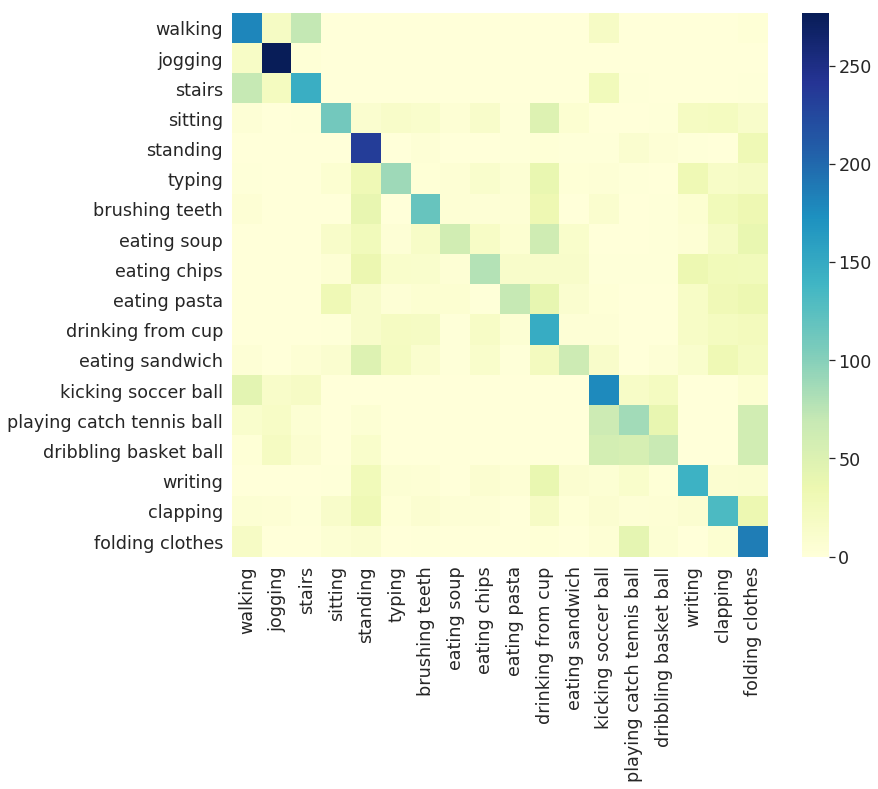

In [145]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
_ = sns.heatmap(cm_act, cmap="YlGnBu")

In [146]:
sns.set(font_scale=1.2)

In [147]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.616438
jogging,0.926421
stairs,0.541045
sitting,0.384083
standing,0.795918
typing,0.332090
brushing teeth,0.397959
eating soup,0.209790
eating chips,0.276596
eating pasta,0.260223


In [148]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.49      0.62      0.54       292
           B       0.73      0.93      0.82       299
           C       0.55      0.54      0.55       268
           D       0.55      0.38      0.45       289
           E       0.44      0.80      0.56       294
           F       0.51      0.33      0.40       268
           G       0.55      0.40      0.46       294
           H       0.62      0.21      0.31       286
           I       0.47      0.28      0.35       282
           J       0.58      0.26      0.36       269
           K       0.31      0.49      0.38       301
           L       0.51      0.23      0.31       283
           M       0.44      0.60      0.51       299
           O       0.36      0.30      0.33       290
           P       0.42      0.24      0.30       287
           Q       0.48      0.50      0.49       283
           R       0.39      0.46      0.42       291
           S       0.31    

In [149]:
accuracy_score(y_true=y_test, y_pred=y_test_pred)

0.45864807282587644

In [150]:
log_loss(y_test, dt_best_classifier.predict_proba(X_test))

2.028744975032476



---

# **Logistic Regression Model:**

---



In [151]:
from sklearn.linear_model import LogisticRegression
import warnings

warnings.filterwarnings('ignore')
#%matplotlib inline

In [152]:
lr_classifier = LogisticRegression(verbose = 0)

In [153]:
my_param_grid = {'C': [10, 50, 100, 200]}

In [154]:
lr_model_gs = GridSearchCV(estimator=lr_classifier, 
                           param_grid=my_param_grid, 
                           cv=my_cv, 
                           scoring = 'accuracy')

In [155]:
lr_model_gs.fit(X_train, y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             error_score='raise-deprecating',
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='warn',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='warn',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='warn', n_jobs=None, param_grid={'C': [10, 50, 100, 200]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=0)

In [156]:
lr_best_classifier = lr_model_gs.best_estimator_

In [157]:
lr_model_gs.cv_results_

{'mean_fit_time': array([14.79050989, 22.50659056, 28.53647175, 34.86096182]),
 'std_fit_time': array([1.04755639, 0.71850121, 1.09153039, 0.91304341]),
 'mean_score_time': array([0.00770249, 0.00802789, 0.00842166, 0.00853901]),
 'std_score_time': array([0.0002215 , 0.00038051, 0.00077414, 0.0009661 ]),
 'param_C': masked_array(data=[10, 50, 100, 200],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'C': 10}, {'C': 50}, {'C': 100}, {'C': 200}],
 'split0_test_score': array([0.37925097, 0.38613861, 0.3893672 , 0.3921653 ]),
 'split1_test_score': array([0.37882049, 0.38613861, 0.38958244, 0.39238054]),
 'split2_test_score': array([0.38032716, 0.39517865, 0.39797675, 0.3971158 ]),
 'split3_test_score': array([0.38118812, 0.38807576, 0.39130435, 0.39195006]),
 'split4_test_score': array([0.38269479, 0.39087387, 0.39151959, 0.39087387]),
 'mean_test_score': array([0.38045631, 0.3892811 , 0.39195006, 0.39289712]),
 'std_test_s

In [158]:
lr_best_classifier.get_params()

{'C': 200,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'warn',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'warn',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [159]:
scores = cross_val_score(lr_best_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[0.3882910030133448,
 0.39324149806284975,
 0.3824795523030564,
 0.38958243650452,
 0.39539388721480845]

<font size="4">Applying model to train set first, just to verify that there is no substantial overfitting</font>

In [160]:
y_train_pred=lr_best_classifier.predict(X_train)
#print(pd.DataFrame(y_train_pred))

In [161]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.41113407388271767

In [162]:
log_loss(y_train, lr_best_classifier.predict_proba(X_train))

1.823161468939136

<font size="4">Applying the best rf model on the test set:</font>

In [163]:
y_test

0       E
1       Q
2       M
3       F
4       Q
       ..
5158    Q
5159    E
5160    O
5161    B
5162    O
Name: ACTIVITY, Length: 5163, dtype: object

In [164]:
y_test_pred = lr_best_classifier.predict(X_test)
print(pd.DataFrame(y_test_pred))

      0
0     E
1     G
2     M
3     E
4     F
...  ..
5158  Q
5159  P
5160  O
5161  B
5162  E

[5163 rows x 1 columns]


In [165]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred)
 #                     y_pred=y_test_pred, normalize = 'true')
    
cm_act = pd.DataFrame(cm,
                      index=lr_best_classifier.classes_,
                      columns=lr_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,206,7,46,0,0,0,0,0,0,0,1,0,23,4,1,0,1,3
jogging,8,277,10,1,0,0,0,0,0,0,0,0,1,1,1,0,0,0
stairs,49,10,172,1,0,0,0,0,0,0,0,0,20,7,6,0,0,3
sitting,0,3,3,92,12,15,23,7,13,10,27,18,1,3,0,43,14,5
standing,0,1,0,2,204,3,15,0,8,2,0,7,1,6,15,6,7,17
typing,0,2,0,5,32,36,16,7,28,16,62,13,1,6,1,23,16,4
brushing teeth,0,1,4,4,29,2,124,10,9,9,20,16,0,5,7,23,26,5
eating soup,1,0,0,20,28,18,24,38,28,14,33,30,0,1,0,13,15,23
eating chips,0,1,1,12,25,30,31,14,58,30,21,19,1,1,1,12,17,8
eating pasta,0,0,0,11,10,21,24,25,19,27,51,30,2,2,0,16,15,16


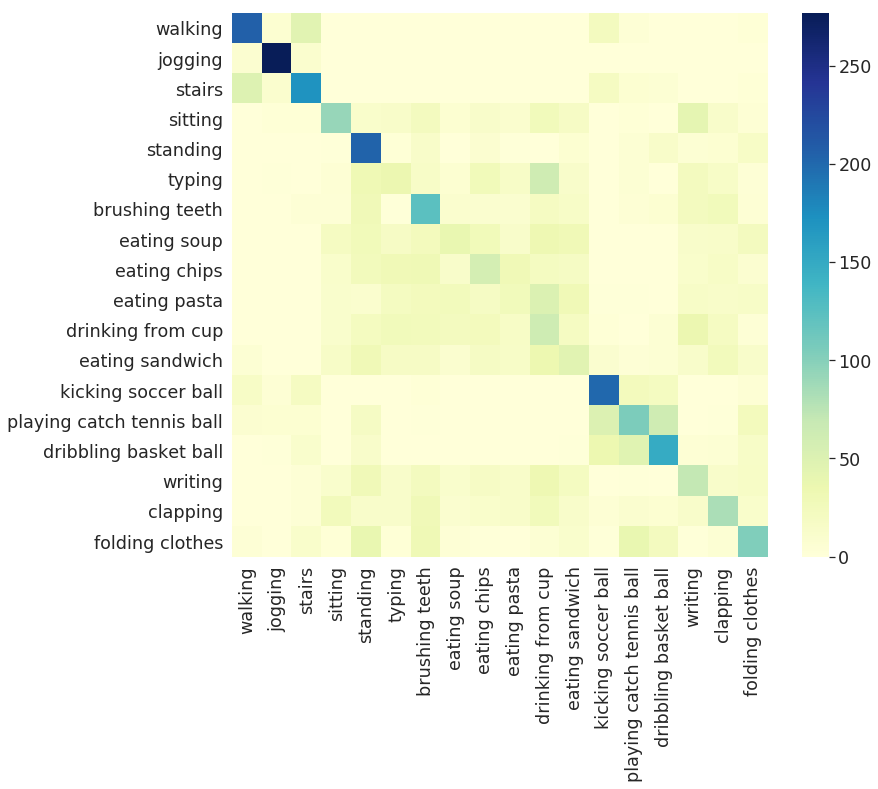

In [166]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(cm_act, cmap="YlGnBu")

In [167]:
sns.set(font_scale=1.2)

In [168]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.705479
jogging,0.926421
stairs,0.641791
sitting,0.318339
standing,0.693878
typing,0.134328
brushing teeth,0.421769
eating soup,0.132867
eating chips,0.205674
eating pasta,0.100372


In [169]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.69      0.71      0.70       292
           B       0.87      0.93      0.90       299
           C       0.59      0.64      0.61       268
           D       0.43      0.32      0.37       289
           E       0.40      0.69      0.51       294
           F       0.18      0.13      0.15       268
           G       0.32      0.42      0.36       294
           H       0.24      0.13      0.17       286
           I       0.24      0.21      0.22       282
           J       0.16      0.10      0.12       269
           K       0.17      0.21      0.18       301
           L       0.19      0.16      0.17       283
           M       0.56      0.67      0.61       299
           O       0.40      0.37      0.38       290
           P       0.49      0.52      0.50       287
           Q       0.26      0.25      0.25       283
           R       0.31      0.29      0.30       291
           S       0.37    

In [170]:
accuracy_score(y_true=y_test, y_pred=y_test_pred)

0.3982180902576022

In [171]:
log_loss(y_test, lr_best_classifier.predict_proba(X_test))

1.8627923212982074



---

# **K Nearest Neighbors Model:**

---



In [172]:
from sklearn.neighbors import KNeighborsClassifier

In [173]:
knn_classifier = KNeighborsClassifier()

In [174]:
my_param_grid = {'n_neighbors': [5, 10, 20], 'leaf_size': [20, 30, 40]}

In [175]:
knn_model_gs = GridSearchCV(estimator = knn_classifier, 
                            param_grid = my_param_grid,
                            cv = my_cv, 
                            scoring ='accuracy')

In [176]:
knn_model_gs.fit(X_train, y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             error_score='raise-deprecating',
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'leaf_size': [20, 30, 40], 'n_neighbors': [5, 10, 20]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=0)

In [177]:
knn_best_classifier = knn_model_gs.best_estimator_

In [178]:
print(knn_model_gs.best_params_)

{'leaf_size': 20, 'n_neighbors': 5}


In [179]:
knn_model_gs.cv_results_

{'mean_fit_time': array([0.06559286, 0.0658844 , 0.06670356, 0.06777496, 0.06404204,
        0.06384554, 0.06252804, 0.06300783, 0.06274424]),
 'std_fit_time': array([0.00059264, 0.00062206, 0.00195117, 0.00490278, 0.0010061 ,
        0.00226358, 0.00186127, 0.00198295, 0.00198914]),
 'mean_score_time': array([1.24672713, 1.63799119, 2.24702454, 1.39224634, 1.72130075,
        2.19576421, 1.28059669, 1.65611401, 2.19008231]),
 'std_score_time': array([0.03252267, 0.02048389, 0.0585382 , 0.06173139, 0.02777753,
        0.03652212, 0.04807538, 0.03185925, 0.06007376]),
 'param_leaf_size': masked_array(data=[20, 20, 20, 30, 30, 30, 40, 40, 40],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'param_n_neighbors': masked_array(data=[5, 10, 20, 5, 10, 20, 5, 10, 20],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_va

In [180]:
knn_best_classifier.get_params()

{'algorithm': 'auto',
 'leaf_size': 20,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [181]:
scores = cross_val_score(knn_best_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[0.7371932845458459,
 0.7384847180370211,
 0.7300904003443822,
 0.7395609126130004,
 0.7518295307791649]

<font size="4">Applying model to train set first, just to verify that there is no substantial overfitting</font>

In [182]:
y_train_pred=knn_best_classifier.predict(X_train)
#print(pd.DataFrame(y_train_pred))

In [183]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.8421596486695945

In [184]:
#y_test

In [185]:
y_test_pred = knn_best_classifier.predict(X_test)
#print(pd.DataFrame(y_test_pred))

In [186]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred)
    
cm_act = pd.DataFrame(cm,
                      index = knn_best_classifier.classes_,
                      columns = knn_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,280,1,6,0,1,0,1,0,0,0,0,0,1,1,1,0,0,0
jogging,6,287,0,0,0,0,0,0,0,0,0,0,3,1,1,0,1,0
stairs,10,8,240,1,0,0,0,0,0,0,0,0,8,0,1,0,0,0
sitting,0,0,4,207,3,5,8,15,7,6,9,2,1,1,1,12,6,2
standing,0,0,1,8,233,3,4,7,3,2,2,5,2,9,5,1,2,7
typing,1,1,0,9,6,202,4,6,13,5,4,5,0,0,0,6,2,4
brushing teeth,0,0,1,8,1,5,223,5,9,5,8,9,1,2,1,10,3,3
eating soup,0,0,0,12,8,13,9,177,8,18,12,12,0,4,1,5,3,4
eating chips,0,1,1,10,6,14,5,11,179,10,20,10,0,2,3,6,3,1
eating pasta,0,0,1,3,7,6,9,13,13,177,13,12,1,0,3,4,5,2


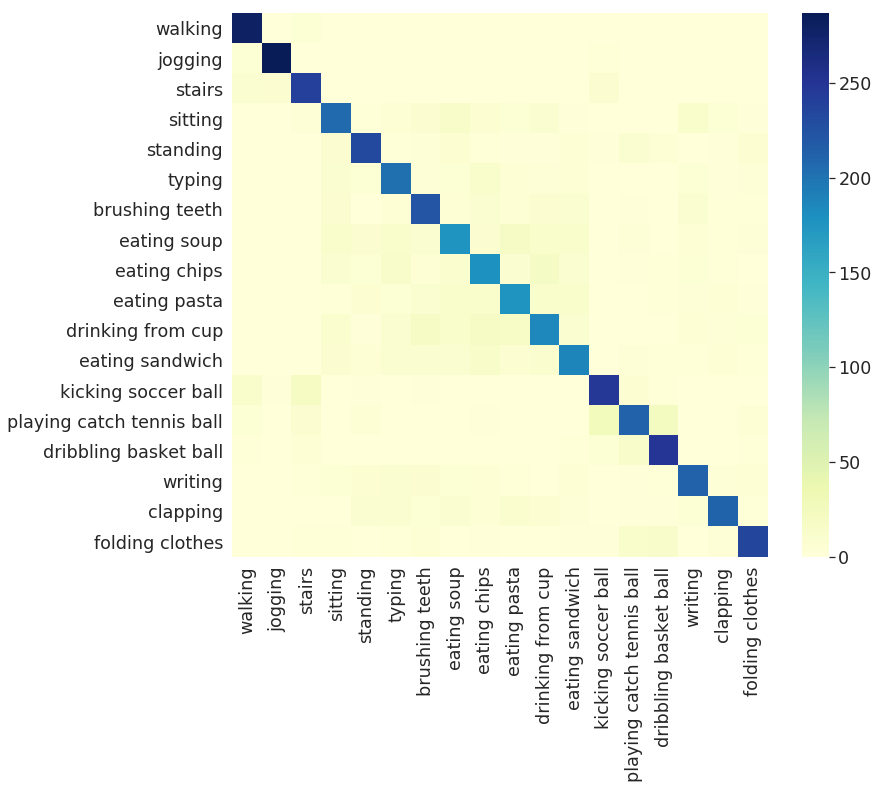

In [187]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
_ = sns.heatmap(cm_act, cmap="YlGnBu")

In [188]:
sns.set(font_scale=1.2)

In [189]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.958904
jogging,0.959866
stairs,0.895522
sitting,0.716263
standing,0.792517
typing,0.753731
brushing teeth,0.758503
eating soup,0.618881
eating chips,0.634752
eating pasta,0.657993


In [190]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.87      0.96      0.91       292
           B       0.95      0.96      0.95       299
           C       0.81      0.90      0.85       268
           D       0.72      0.72      0.72       289
           E       0.78      0.79      0.79       294
           F       0.70      0.75      0.73       268
           G       0.71      0.76      0.74       294
           H       0.65      0.62      0.63       286
           I       0.64      0.63      0.64       282
           J       0.68      0.66      0.67       269
           K       0.68      0.62      0.65       301
           L       0.70      0.66      0.68       283
           M       0.82      0.83      0.82       299
           O       0.77      0.73      0.75       290
           P       0.79      0.87      0.83       287
           Q       0.79      0.75      0.77       283
           R       0.83      0.73      0.78       291
           S       0.83    

In [191]:
accuracy_score(y_true = y_test, y_pred = y_test_pred)

0.7648653883401123

---
## **Models mean prediction accuracy scores summary:**
---
Decision Tree: 0.33

Random Forest: 0.44

Logistic Regression: 0.38

KNN: 0.77

---
# **Insights & Conclusions:**
---
1) The K Nearest Neighbor classifier has prooved to provide substantial higher prediction accuracy than the rest of the models (overall mean accuracy ~0.77 on test set) in this case.

2) The analysis demonstrated typical differentiation of detection accuracy accross the various physical activities:

The highest detection accuracy is for Jogging: ~0.95
walking, stairs, kicking soccer ball, dribbling basket ball also have high accuracies: ~0.8
On the other hand, the eating related activities have lower detection accuracies: ~0.6
However, this lower accuracy is still surprisingly significant ! (10 times the neutral guess accuracy, 1/18), considering the fact that the smartphone was placed inside the participant's pants leg pocket !

3) The accuracy profiles are consistent with the visual clustering patterns seen in the three dimentional features visualization plots & t-SNE, in particular, the jogging points clusters where exceptionally noticable and distinct.

4) Possible explanations of the above observations:

The Jogging etc. where highly predictable because they where the most intense and strongly related to leg movement (the phone was inside the leg pocket)

The suprisingly significant accuracy rates of identifying eatings activites by the phone might be explained by the posture sitting changes characterizing such activities:

The fact that the accelerometer measures also the gravity vector, could supply additional implied information pertaining the orientation of the device and, therefore, as to the posture mode (standing/sitting) of the participant, which could contribute to the accuracy detection ability.

